## 1 EDA (Анализ данных)

### 1.1.Описание данных

Целевыми переменными являются

#### IC50 (Inhibitory Concentration 50%) —  
концентрация вещества (например, лекарства или ингибитора), при которой наблюдается подавление активности исследуемого биологического процесса или фермента на 50%. mM — миллимоляр, единица измерения концентрации (миллимоль на литр, 1 mM = 0.001 моль/л). IC50, mM — это значение концентрации вещества в миллимолях на литр, при которой эффект ингибирования достигает 50%. Чем меньше IC50, тем сильнее вещество ингибирует процесс.

#### CC50, mM (Cytotoxic Concentration 50%)
—  концентрация вещества (обычно в миллимолях на литр, mM), при которой наблюдается гибель 50% клеток в исследуемой популяции. Показатель используется для оценки токсичности соединения: чем выше CC50, тем менее токсично вещество для клеток. CC50 — от англ. Cytotoxic Concentration 50% (цитотоксическая концентрация 50%). mM — миллимоляр, 1 mM = 0.001 моль/л.

#### SI (Selectivity Index, индекс селективности)
показатель  оценки избирательности действия вещества между двумя биологическими объектами, например, между раковыми и нормальными клетками.
В контексте фармакологии и токсикологии SI часто рассчитывается как отношение токсичности к эффективности:
SI = CC50 / IC50

CC50 — концентрация, вызывающая гибель 50% клеток (токсичность)
IC50 — концентрация, подавляющая активность на 50% (эффективность)
Чем выше SI, тем более селективно вещество (то есть оно эффективнее действует на мишень и менее токсично для других клеток).



In [371]:
# Подключение библиотек

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import numpy as np






In [372]:
# Загрузка данных
dataset = pd.read_excel('F:\\MIFI-github\\Course work Classic ML\\Data\\002 Dataset.xlsx')
# dataset = pd.read_excel('J:\\MIFI-github\\Course work Classic ML\\Data\\002 Dataset.xlsx')



In [373]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1001 entries, 0 to 1000
Columns: 214 entries, Unnamed: 0 to fr_urea
dtypes: float64(107), int64(107)
memory usage: 1.6 MB


In [374]:

# Вывод первых 10 строк
dataset.head(10)

,Unnamed: 0,"IC50, mM","CC50, mM",SI,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,0,6.239374,175.482382,28.125000,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,...,0,0,0,0,0,0,0,0,3,0
1,1,0.771831,5.402819,7.000000,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,...,0,0,0,0,0,0,0,0,3,0
2,2,223.808778,161.142320,0.720000,2.627117,2.627117,0.543231,0.543231,0.260923,42.187500,...,0,0,0,0,0,0,0,0,3,0
3,3,1.705624,107.855654,63.235294,5.097360,5.097360,0.390603,0.390603,0.377846,41.862069,...,0,0,0,0,0,0,0,0,4,0
4,4,107.131532,139.270991,1.300000,5.150510,5.150510,0.270476,0.270476,0.429038,36.514286,...,0,0,0,0,0,0,0,0,0,0
5,5,15.037911,30.075821,2.000000,5.758408,5.758408,0.278083,0.278083,0.711012,28.600000,...,0,0,0,0,0,0,0,0,0,0
6,6,18.908167,14.559288,0.770000,2.584472,2.584472,0.429649,0.429649,0.328539,36.564103,...,0,0,0,0,0,0,0,0,0,0
7,7,28.773087,23.593931,0.820000,13.821880,13.821880,0.079845,-0.301260,0.217332,31.333333,...,0,0,0,0,0,0,0,0,4,0
8,8,50.057068,153.709268,3.070681,14.171614,14.171614,0.019123,-0.411828,0.187781,29.157895,...,0,0,0,0,0,0,0,0,0,0
9,9,6.400847,400.906360,62.633333,6.135893,6.135893,0.239226,0.239226,0.439915,36.400000,...,0,0,0,0,0,0,0,0,0,0


In [375]:
# Общее количество NaN во всем DataFrame
NaNs_count = dataset.isna().sum().sum()
print(f"Общее количество NaN: {NaNs_count}")

Общее количество NaN: 36


Датасет содержит 1 000 строк, 214 столбцов со значениями типа float64 и int64, 36 значений Nan. 
Следует отметить, что объем датасета является малым поэтому преобразование данных, особенно в части удаления следует производить аккуратно.
Датасет содержит столбец Unnamed: 0, который представляет собой дублирование индексов, не является информативным и може быть удален из датасет.

Таким образом, необходимо выполнить следующие преобразования данных: 
1. Заменить все значения NaN на значения 0;
2. Удалить столбце Unnamed: 0;


In [376]:
# Удаление стобца Unnnamed: 0
dataset = dataset.drop(['Unnamed: 0'], axis=1)
dataset.head()

,"IC50, mM","CC50, mM",SI,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,6.239374,175.482382,28.125000,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,384.652,...,0,0,0,0,0,0,0,0,3,0
1,0.771831,5.402819,7.000000,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,388.684,...,0,0,0,0,0,0,0,0,3,0
2,223.808778,161.142320,0.720000,2.627117,2.627117,0.543231,0.543231,0.260923,42.187500,446.808,...,0,0,0,0,0,0,0,0,3,0
3,1.705624,107.855654,63.235294,5.097360,5.097360,0.390603,0.390603,0.377846,41.862069,398.679,...,0,0,0,0,0,0,0,0,4,0
4,107.131532,139.270991,1.300000,5.150510,5.150510,0.270476,0.270476,0.429038,36.514286,466.713,...,0,0,0,0,0,0,0,0,0,0


In [377]:
# Замена всех NaN на 0.
dataset = dataset.fillna(0)

# Проверка корректности преобразования.
NaNs_count = dataset.isna().sum().sum()
print(f"Общее количество NaN: {NaNs_count}")


Общее количество NaN: 0


### 1.2 Поиск выбросов в данных 

Поиск выброс будет производится только среди целевых переменных, а именно только в стобцах (для каждого в отдельности): "IC50, mM", "CC50", "mM, SI". Подобный подход представляется оправданным, так как выявление выбросов в указанных столбцах неизбежно приведен к удалению части данных, при этом удаление выбросов из иных столбцов приведен к значительному сокращению числа данных, что в дальнейшем скажется на качестве обученной модели.В результате удаление будет произведено относительно каждой целевой переменной в отдельности, что привдеен к возникнвоению отдельного датасета для каждой из целевых переменных.



### 1.2.1 Блок вспомогательных инструментов (функций)

In [ ]:
# Создадим функцию для визуализации одного столбца в датасете c помощью нескольких графиков.

def visualize_column(dataset, column_name):
	sns.set(style="whitegrid", font_scale=0.5)
	indices = dataset.index
	step = max(1, len(indices) // 60)

	# Столбчатая диаграмма
	plt.figure(figsize=(10, 4))
	sns.barplot(
		data=dataset,
		x=indices,
		y=column_name,
		palette="viridis",
		alpha=0.8,
		edgecolor='black',
		linewidth=1
	)

	plt.title(f"Столбчатая диаграмма значений {column_name}", pad=20)
	plt.xlabel("Номер наблюдения или категория")
	plt.ylabel(column_name)
	plt.xticks(
		ticks=indices[::step],
		labels=indices[::step],
		rotation=90,
		ha='center',
		fontsize=6,
		fontweight='bold'
	)
	plt.grid(axis='y', linestyle='--', alpha=0.6)
	plt.tight_layout()
	plt.show()

	# Комплексная визуализация
	sns.set(style="whitegrid")
	plt.figure(figsize=(25, 10))

	plt.subplot(1, 5, 1)
	sns.boxplot(y=dataset[column_name], color='skyblue')
	plt.title('Boxplot (Ящик с усами)')
	plt.ylabel('Значения')

	plt.subplot(1, 5, 2)
	sns.violinplot(y=dataset[column_name], color='lightgreen')
	plt.title('Violinplot (Скрипичная диаграмма)')
	plt.ylabel('')

	plt.subplot(1, 5, 3)
	sns.swarmplot(
		data=dataset,
		y=column_name,
		color="blue",
		size=3
	)

	plt.title(f"Точечное распределение {column_name}")
	plt.ylabel(f"{column_name} (значения)")
	plt.xlabel("Наблюдения")

	plt.subplot(1, 5, 4)
	sns.set(style="whitegrid", font_scale=1.1)
	scatter = sns.scatterplot(
		data=dataset,
		x=indices,
		y=column_name,
		hue=column_name,
		palette="viridis",
		size=column_name,
		sizes=(20, 200),
		alpha=0.7,
		edgecolor='black'
	)

	plt.title(f"Точечный график значений {column_name}", pad=20)
	plt.xlabel("Номер наблюдения")
	plt.ylabel(column_name)
	plt.xticks(rotation=45)
	plt.colorbar(scatter.collections[0], label=f'Концентрация {column_name}')
	plt.grid(True, linestyle='--', alpha=0.6)
	plt.tight_layout()

	plt.subplot(1, 5, 5)
	sns.histplot(data=dataset, x=dataset[column_name], kde=True, bins=40, color="skyblue")
	plt.title(f"Гистограмма столбца {column_name}")
	plt.xlabel(column_name)
	plt.ylabel("Частота")
	plt.show()

	# Расчет выбросов
	Qrt1 = dataset[column_name].quantile(0.25)
	Qrt3 = dataset[column_name].quantile(0.75)
	IQR = Qrt3 - Qrt1
	outliers = dataset[(dataset[column_name] < (Qrt1 - 1.5 * IQR)) | (dataset[column_name] > (Qrt3 + 1.5 * IQR))]
	print(f'Количество выбросов по {column_name}: {outliers.shape[0]}')
	print(f'Нижняя граница: {Qrt1 - 1.5 * IQR:.3f} по графику Boxplot')
	print(f'Верхняя граница: {Qrt3 + 1.5 * IQR:.3f} по графику Boxplot')
	return

# Создание функции для нахождения и удаления выбросов в выбранном столбце датасета
# Функция будет находить границу за которой начинаются выбросы, удалять соответсвующие строки и повторять процесс 
# до тех пор, пока количество выбросв не будет равным нулю. Функция возвращает датасет, в котором выбросы исключены.

def remove_all_outliers(df, column):
    
    df_clean = df.copy()
    total_removed = 0

    while True:
        Q1 = df_clean[column].quantile(0.25)
        Q3 = df_clean[column].quantile(0.75)
        IQR = Q3 - Q1
        upper_bound = Q3 + 1.5 * IQR

        # Найти выбросы сверху
        outliers = df_clean[df_clean[column] > upper_bound]
        num_outliers = outliers.shape[0]

        print(f"Верхняя граница: {upper_bound:.3f}, выбросов сверху: {num_outliers}")

        if num_outliers == 0:
            break

        # Удалить выбросы сверху
        df_clean = df_clean[df_clean[column] <= upper_bound]
        total_removed += num_outliers

    print(f" Всего удалено строк: {total_removed}")
    return df_clean

# Функция для построения тепловой карты корреляций признаков в датасете
def dataset_heatmap(df, figsize=(26, 22), annot=False, cmap='coolwarm'):
  
    plt.figure(figsize=figsize)
    corr = df.corr()
    sns.heatmap(corr, annot=annot, cmap=cmap, fmt=".2f", linewidths=0.5)
    plt.title('Тепловая карта корреляций признаков')
    plt.show()

# Функция для отображения корреляции выбраннго (целевого) столбца с другими признаками

def target_corr(df, target_col, top_n=None):
    """
    Выводит корреляцию целевого столбца с другими признаками.
    
    :param df: pandas DataFrame
    :param target_col: имя целевого столбца (str)
    :param top_n: количество признаков с наибольшей корреляцией (если None — выводит все)
    """
    corr_series = df.corr()[target_col].drop(target_col).sort_values(ascending=False, key=abs)
    if top_n is not None:
        corr_series = corr_series.head(top_n)
    print(f"Корреляция признаков с целевым столбцом '{target_col}':")
    print(corr_series)
    
# Функция для отображения корреляции целевого столбца с другими признаками и удаляет признаки с NaN корреляцией
def target_corr_clean(df, target_col, top_n=None):
    """
    Выводит корреляцию целевого столбца с другими признаками.
    Удаляет столбцы, корреляция которых с целевой переменной равна NaN, выводит лог удаления.
    Возвращает новый датасет без этих столбцов.
    
    :param df: pandas DataFrame
    :param target_col: имя целевого столбца (str)
    :param top_n: количество признаков с наибольшей корреляцией (если None — выводит все)
    :return: (Series с корреляциями, DataFrame без NaN-столбцов)
    """
    corr_series = df.corr()[target_col].drop(target_col)
    nan_cols = corr_series[corr_series.isna()].index.tolist()
    if nan_cols:
        print(f"Удалены столбцы с NaN корреляцией с '{target_col}': {nan_cols}")
        df_clean = df.drop(columns=nan_cols)
        corr_series = corr_series.drop(nan_cols)
    else:
        print("Нет столбцов с NaN корреляцией.")
        df_clean = df.copy()
    corr_series = corr_series.sort_values(ascending=False, key=abs)
    if top_n is not None:
        corr_series = corr_series.head(top_n)
    print(f"Корреляция признаков с целевым столбцом '{target_col}':")
    print(corr_series)
    return df_clean
    
def remove_highly_correlated_features(df, target_col, threshold=0.7):
    """
    Удаляет из датасета признаки, которые сильно коррелируют между собой (|corr| > threshold).
    Из пары удаляется тот признак, у которого корреляция с целевой переменной меньше.
    Возвращает новый датасет и список удалённых признаков.
    
    :param df: pandas DataFrame
    :param target_col: имя целевого столбца (str)
    :param threshold: порог корреляции (по модулю)
    :return: DataFrame без сильно коррелирующих признаков, список удалённых признаков
    """
    corr_matrix = df.drop(columns=[target_col]).corr().abs()
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    to_drop = set()
    
    for col1 in upper.columns:
        for col2 in upper.index:
            if upper.loc[col2, col1] > threshold:
                # Сравниваем корреляцию с целевой переменной
                corr1 = abs(df[col1].corr(df[target_col]))
                corr2 = abs(df[col2].corr(df[target_col]))
                if corr1 < corr2:
                    to_drop.add(col1)
                else:
                    to_drop.add(col2)
    
    if to_drop:
        print(f"Удалены признаки с высокой взаимной корреляцией (>{threshold}): {list(to_drop)}")
    else:
        print("Нет сильно коррелирующих признаков для удаления.")
    df_clean = df.drop(columns=list(to_drop))
    return df_clean, list(to_drop)

from sklearn.preprocessing import StandardScaler

def normalize_features(df, target_col):
    """
    Нормализует все признаки (кроме целевого столбца) с помощью StandardScaler.
    Возвращает новый DataFrame с нормализованными признаками и целевым столбцом в начале.
    """
    features = df.drop(columns=[target_col])
    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features)
    df_scaled = pd.DataFrame(features_scaled, columns=features.columns, index=df.index)
    # Добавляем целевой столбец в начало
    df_scaled.insert(0, target_col, df[target_col].values)
    return df_scaled
	

### 1.2.2 Поиск выбросов в данных в датасете для целевой переменной IC50


In [379]:
### Дальнейшее исследование данных следует производить относительно одной целевой переменой. 
# Для этих целей следует создать отдельный датасет из которого исключены 2 другие целевые переменные.

dataset_for_IC50 = dataset.drop(['CC50, mM', 'SI'], axis=1)
dataset_for_IC50.head() 

,"IC50, mM",MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,6.239374,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,384.652,340.300,384.350449,...,0,0,0,0,0,0,0,0,3,0
1,0.771831,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,388.684,340.300,388.381750,...,0,0,0,0,0,0,0,0,3,0
2,223.808778,2.627117,2.627117,0.543231,0.543231,0.260923,42.187500,446.808,388.344,446.458903,...,0,0,0,0,0,0,0,0,3,0
3,1.705624,5.097360,5.097360,0.390603,0.390603,0.377846,41.862069,398.679,352.311,398.366099,...,0,0,0,0,0,0,0,0,4,0
4,107.131532,5.150510,5.150510,0.270476,0.270476,0.429038,36.514286,466.713,424.377,466.334799,...,0,0,0,0,0,0,0,0,0,0


C:\Users\Eve\AppData\Local\Temp\ipykernel_4440\4256989136.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


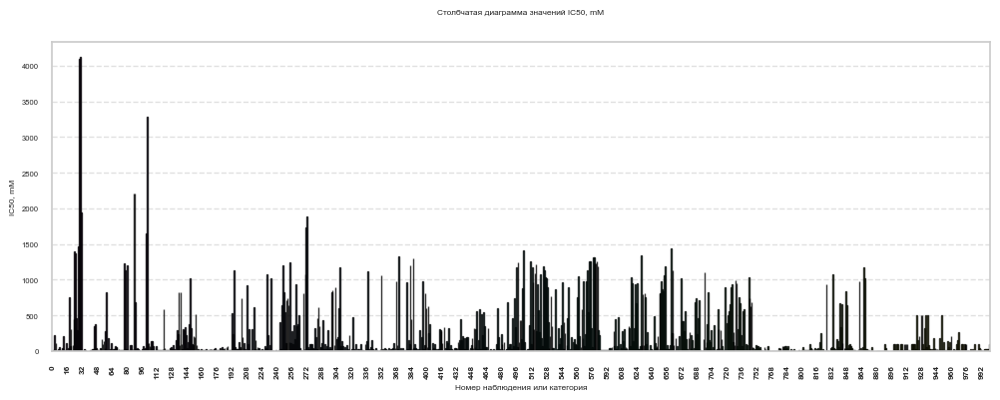

C:\Users\Eve\AppData\Roaming\Python\Python312\site-packages\seaborn\categorical.py:3399: UserWarning: 31.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


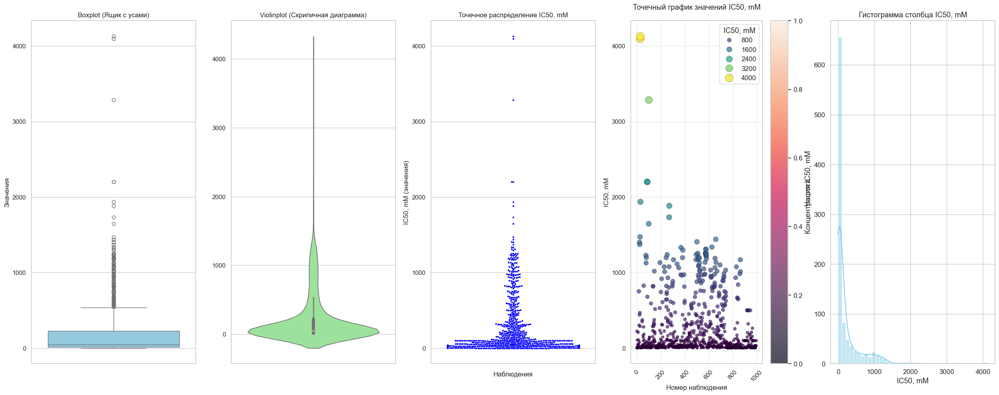

Количество выбросов по IC50, mM: 147
Нижняя граница: -306.175 по графику Boxplot
Верхняя граница: 543.667 по графику Boxplot


In [380]:
visualize_column(dataset_for_IC50, 'IC50, mM')

Полученные графики указывают на то, что распределение значений для показателя IC50 не является нормальным. 
из графиков выброс для целевой переменной IC50 начинаются после значений 543. Следует выполнить удаление всех строк, содержащих IC50 более 543. Если сопоставить графки скрипичный и точечного распределения можно сделать вывод о возможности выявления 2 классов показателей.

In [381]:
## Сформируем новый датасет, в котором будут только те наблюдения, где IC50 меньше 543 мМ.


dataset_for_IC50[dataset_for_IC50['IC50, mM'] <= 543].info()

<class 'pandas.core.frame.DataFrame'>
Index: 854 entries, 0 to 1000
Columns: 211 entries, IC50, mM to fr_urea
dtypes: float64(105), int64(106)
memory usage: 1.4 MB


In [382]:
## Сформируем новый датасет, в котором будут только те наблюдения, где IC50 меньше 543 мМ.
## Новый датасет будет содержать в названии 854, что соответствует количеству наблюдений в нем.
dataset_for_IC50_854 = dataset_for_IC50[dataset_for_IC50['IC50, mM'] <= 543]

dataset_for_IC50_854.info()


<class 'pandas.core.frame.DataFrame'>
Index: 854 entries, 0 to 1000
Columns: 211 entries, IC50, mM to fr_urea
dtypes: float64(105), int64(106)
memory usage: 1.4 MB


В результате удаления выбросов полученные датасет сократился до 854 строк.
Полученная верися датасета будет использоваться отдельно.

C:\Users\Eve\AppData\Local\Temp\ipykernel_4440\4256989136.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


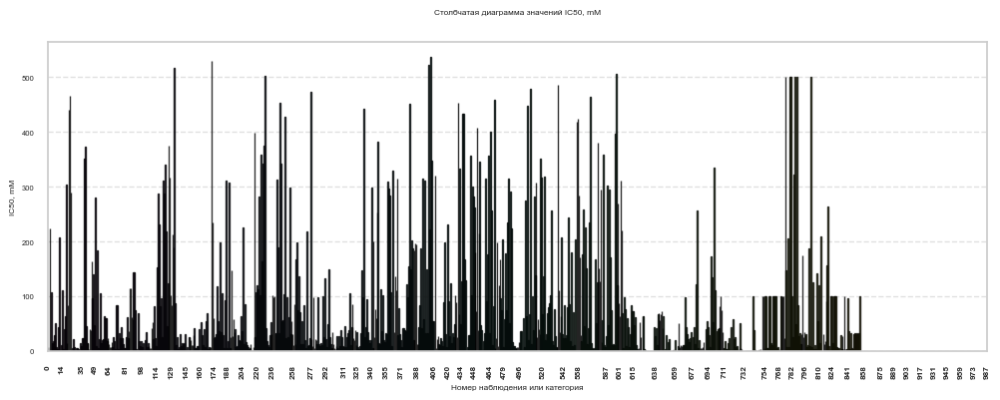

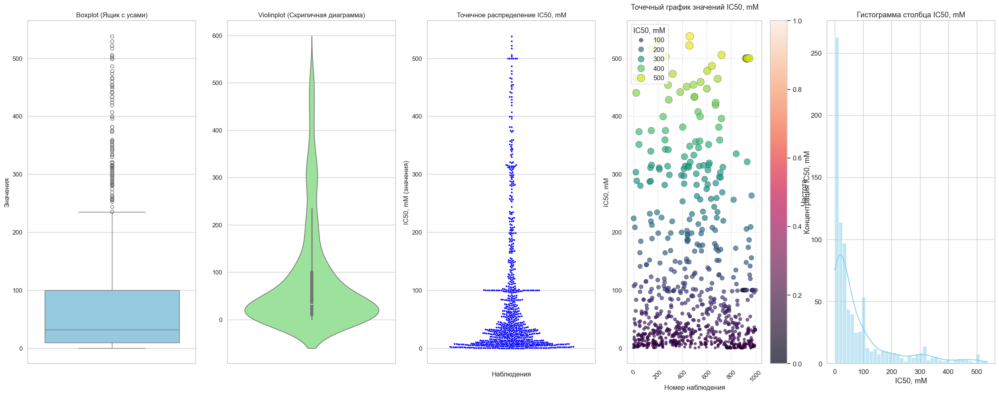

Количество выбросов по IC50, mM: 98
Нижняя граница: -125.490 по графику Boxplot
Верхняя граница: 235.294 по графику Boxplot


In [383]:
# Вывод информации о столбцах датасета dataset_for_IC50_854
visualize_column(dataset_for_IC50_854, 'IC50, mM')


Как видно в датасете все еще есть находятся выброс. Это означает, что одного выявления выбросов и их удаления не достаточно.
Восльзуемся функцией remove_all_outlires для нахождения объема датасета, при котором выбросы не наблюдаются. 


In [384]:
# Сокращаем количество выбросов до 0 с помощью функции remove_all_outliers
# Если сократить количество выбросов до 0, то в датасете останется 567 строк.
dataset_for_IC50_567 = remove_all_outliers(dataset_for_IC50, 'IC50, mM')
dataset_for_IC50_567.info()

Верхняя граница: 543.667, выбросов сверху: 147
Верхняя граница: 235.294, выбросов сверху: 98
Верхняя граница: 165.002, выбросов сверху: 48
Верхняя граница: 132.849, выбросов сверху: 22
Верхняя граница: 120.631, выбросов сверху: 11
Верхняя граница: 111.225, выбросов сверху: 10
Верхняя граница: 102.701, выбросов сверху: 9
Верхняя граница: 98.601, выбросов сверху: 34
Верхняя граница: 87.034, выбросов сверху: 21
Верхняя граница: 79.043, выбросов сверху: 20
Верхняя граница: 72.802, выбросов сверху: 10
Верхняя граница: 70.812, выбросов сверху: 4
Верхняя граница: 70.727, выбросов сверху: 0
Всего удалено строк: 434
<class 'pandas.core.frame.DataFrame'>
Index: 567 entries, 0 to 999
Columns: 211 entries, IC50, mM to fr_urea
dtypes: float64(105), int64(106)
memory usage: 939.1 KB


C:\Users\Eve\AppData\Local\Temp\ipykernel_4440\4256989136.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


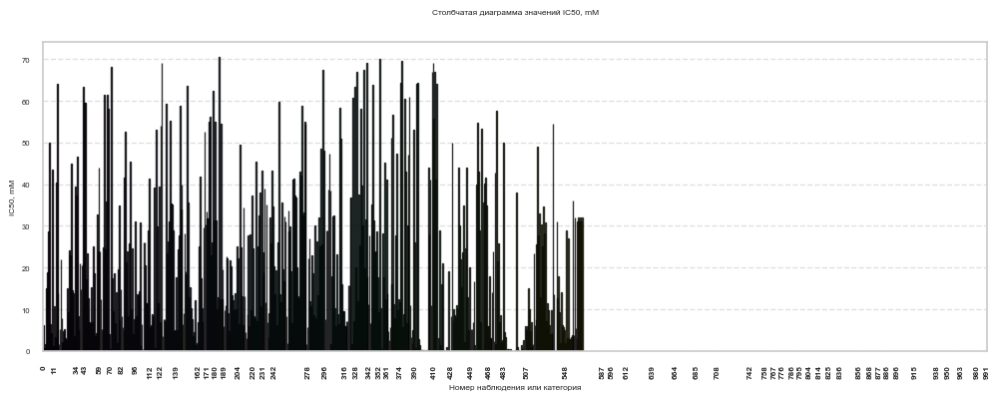

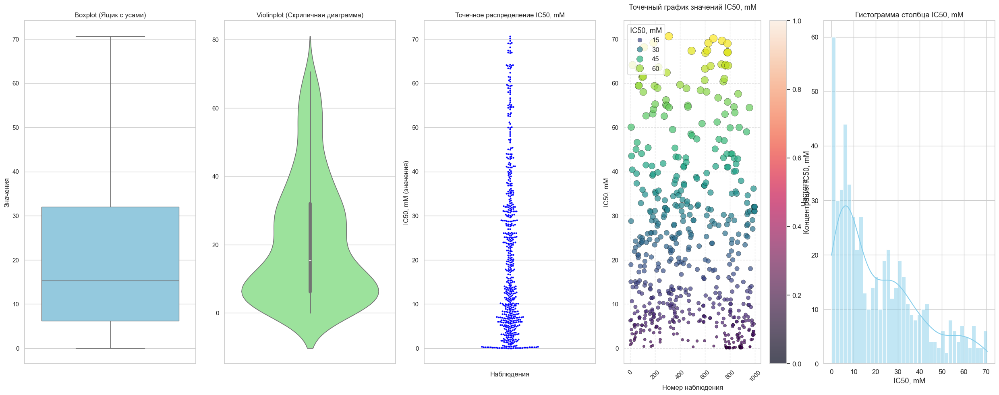

Количество выбросов по IC50, mM: 0
Нижняя граница: -32.549 по графику Boxplot
Верхняя граница: 70.727 по графику Boxplot


In [385]:
# Вывод информации о столбцах dataset_for_IC50_567
visualize_column(dataset_for_IC50_567, 'IC50, mM')

Получаем, что выбросы для значений IC50 не наблюдаются при объеме датасета в размере 567, то чуть более 50% от изнаачльного датасета, что может быть не достаточно для качесвтенного обучения модели.Сохраним данный датасет отдельно.
Таким образом для признака IC50 получено 2 датасета

dataset_for_IC50_567; 
dataset_for_IC50_854.


### 1.2.3 Исследование корреляции признаков в датасете для целевой переменной IC50






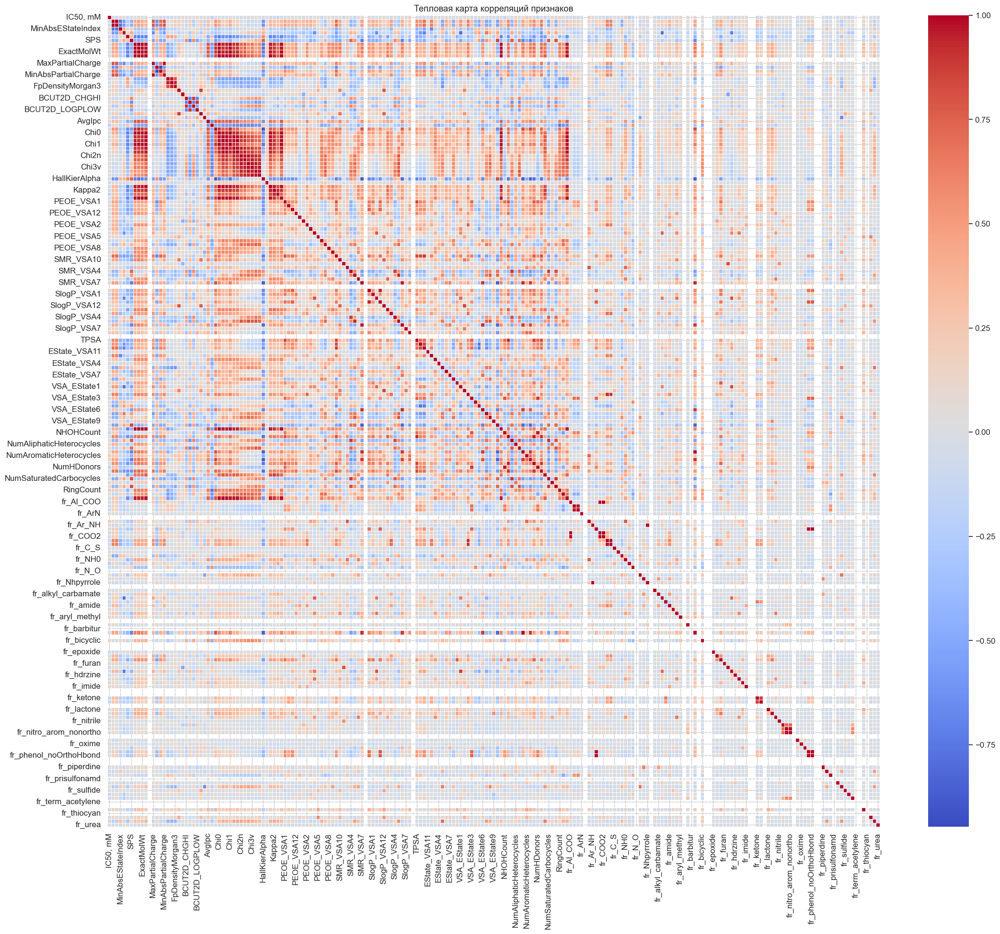

In [386]:
# Отображение тепловой карты корреляций признаков для dataset_for_IC50_567 
# для целевой переменной IC50, mM
dataset_heatmap(dataset_for_IC50_567)

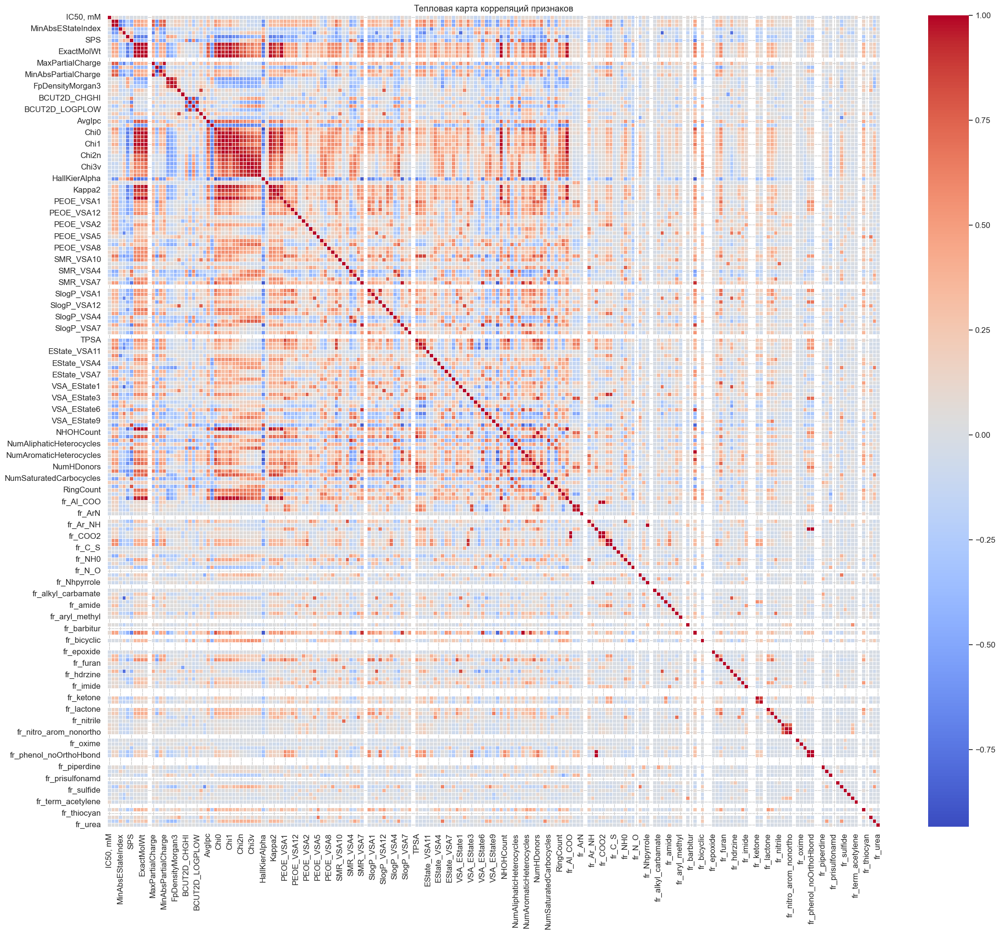

In [387]:
# Отображение тепловой карты корреляций признаков для dataset_for_IC50_854 
# для целевой переменной IC50, mM
dataset_heatmap(dataset_for_IC50_854)

Из типловых карт видно, что наиболее созависимые признаки сосредоточены в условно верхнем левом квадрате.
Важно, что по отношению к целевой переменной все остальные признаки слабо коррелируют

In [388]:
# Вывод признаков, коррелирующих с целевой переменной IC50, mM
print("Корреляция признаков с целевой переменной IC50, mM для датасета dataset_for_IC50_567:")
target_corr(dataset_for_IC50_567, 'IC50, mM')

print("\nКорреляция признаков с целевой переменной IC50, mM для датасета dataset_for_IC50_854:")
target_corr(dataset_for_IC50_854, 'IC50, mM')

Корреляция признаков с целевой переменной IC50, mM для датасета dataset_for_IC50_567:
Корреляция признаков с целевым столбцом 'IC50, mM':
fr_NH1                    -0.214035
NumAromaticHeterocycles    0.213147
RingCount                  0.193544
SlogP_VSA8                 0.173767
BalabanJ                  -0.171858
                             ...   
fr_phos_ester                   NaN
fr_prisulfonamd                 NaN
fr_term_acetylene               NaN
fr_tetrazole                    NaN
fr_thiocyan                     NaN
Name: IC50, mM, Length: 210, dtype: float64

Корреляция признаков с целевой переменной IC50, mM для датасета dataset_for_IC50_854:
Корреляция признаков с целевым столбцом 'IC50, mM':
NumAliphaticHeterocycles    0.229249
NumSaturatedHeterocycles    0.208000
NumAliphaticCarbocycles    -0.171833
fr_NH2                     -0.170368
NumSaturatedCarbocycles    -0.146000
                              ...   
fr_phos_acid                     NaN
fr_phos_ester           

Исследования корреляции признаков по отношению к целевой переменной показывают наличие значений NaN. Это объясняется тем, что некоторые признаки на протяжении всего датасета представляют собой константу, а значит их дисперсия ровна 0. Такие признаки следует удалить из датасета.

In [389]:
### Удалим все признаки, корреляиция которых с целевой переменной IC50, mM равна NaN из обоих датасетов.
dataset_for_IC50_854 = target_corr_clean(dataset_for_IC50_854, 'IC50, mM')
dataset_for_IC50_567 = target_corr_clean(dataset_for_IC50_567, 'IC50, mM')

Удалены столбцы с NaN корреляцией с 'IC50, mM': ['NumRadicalElectrons', 'SMR_VSA8', 'SlogP_VSA9', 'fr_Ar_COO', 'fr_N_O', 'fr_SH', 'fr_azide', 'fr_barbitur', 'fr_benzodiazepine', 'fr_diazo', 'fr_dihydropyridine', 'fr_isocyan', 'fr_isothiocyan', 'fr_lactam', 'fr_nitroso', 'fr_phos_acid', 'fr_phos_ester', 'fr_prisulfonamd', 'fr_tetrazole', 'fr_thiocyan']
Корреляция признаков с целевым столбцом 'IC50, mM':
NumAliphaticHeterocycles    0.229249
NumSaturatedHeterocycles    0.208000
NumAliphaticCarbocycles    -0.171833
fr_NH2                     -0.170368
NumSaturatedCarbocycles    -0.146000
                              ...   
SlogP_VSA1                  0.001826
fr_piperdine                0.001444
FpDensityMorgan1           -0.001008
Chi0                       -0.000364
LabuteASA                   0.000229
Name: IC50, mM, Length: 190, dtype: float64
Удалены столбцы с NaN корреляцией с 'IC50, mM': ['NumRadicalElectrons', 'SMR_VSA8', 'SlogP_VSA9', 'fr_Ar_COO', 'fr_N_O', 'fr_SH', 'fr_azide', '

In [390]:
# Проверка корректности преобразования.
target_corr(dataset_for_IC50_567, 'IC50, mM')
target_corr(dataset_for_IC50_854, 'IC50, mM')

Корреляция признаков с целевым столбцом 'IC50, mM':
fr_NH1                    -0.214035
NumAromaticHeterocycles    0.213147
RingCount                  0.193544
SlogP_VSA8                 0.173767
BalabanJ                  -0.171858
                             ...   
Chi1n                     -0.002445
MolMR                      0.002302
VSA_EState1                0.001562
SlogP_VSA2                -0.001209
Chi2v                     -0.000801
Name: IC50, mM, Length: 189, dtype: float64
Корреляция признаков с целевым столбцом 'IC50, mM':
NumAliphaticHeterocycles    0.229249
NumSaturatedHeterocycles    0.208000
NumAliphaticCarbocycles    -0.171833
fr_NH2                     -0.170368
NumSaturatedCarbocycles    -0.146000
                              ...   
SlogP_VSA1                  0.001826
fr_piperdine                0.001444
FpDensityMorgan1           -0.001008
Chi0                       -0.000364
LabuteASA                   0.000229
Name: IC50, mM, Length: 190, dtype: float64


In [391]:
# С помощью функции remove_highly_correlated_features находим и удаляем признаки, степень корреляиции которых между собой 
#  более (|corr| > 0.7).
dataset_for_IC50_854, dropped = remove_highly_correlated_features(dataset_for_IC50_854, 'IC50, mM')
dataset_for_IC50_567, dropped = remove_highly_correlated_features(dataset_for_IC50_567, 'IC50, mM')

Удалены признаки с высокой взаимной корреляцией (>0.7): ['Kappa2', 'NumSaturatedRings', 'fr_C_O_noCOO', 'VSA_EState6', 'MaxAbsEStateIndex', 'NumSaturatedCarbocycles', 'SMR_VSA6', 'BalabanJ', 'Chi0v', 'SlogP_VSA11', 'TPSA', 'FpDensityMorgan2', 'fr_phenol', 'Kappa3', 'SPS', 'SlogP_VSA6', 'SMR_VSA3', 'HeavyAtomMolWt', 'fr_phenol_noOrthoHbond', 'Chi1n', 'SlogP_VSA4', 'MolMR', 'EState_VSA1', 'fr_nitro', 'SMR_VSA4', 'Chi1', 'PEOE_VSA1', 'Chi3v', 'fr_methoxy', 'NumAromaticHeterocycles', 'MinAbsPartialCharge', 'NOCount', 'FpDensityMorgan1', 'SlogP_VSA12', 'BCUT2D_MRHI', 'Chi0', 'fr_benzene', 'fr_Al_OH', 'Chi4v', 'VSA_EState2', 'NumAromaticCarbocycles', 'EState_VSA9', 'fr_COO', 'Chi0n', 'EState_VSA10', 'Chi4n', 'Chi3n', 'BertzCT', 'SlogP_VSA2', 'NumAliphaticRings', 'SMR_VSA2', 'NumValenceElectrons', 'fr_Al_OH_noTert', 'PEOE_VSA11', 'SMR_VSA10', 'MinEStateIndex', 'SMR_VSA7', 'fr_Ar_NH', 'PEOE_VSA7', 'fr_alkyl_halide', 'MinPartialCharge', 'fr_Al_COO', 'HeavyAtomCount', 'Chi2v', 'Chi1v', 'SlogP_VS

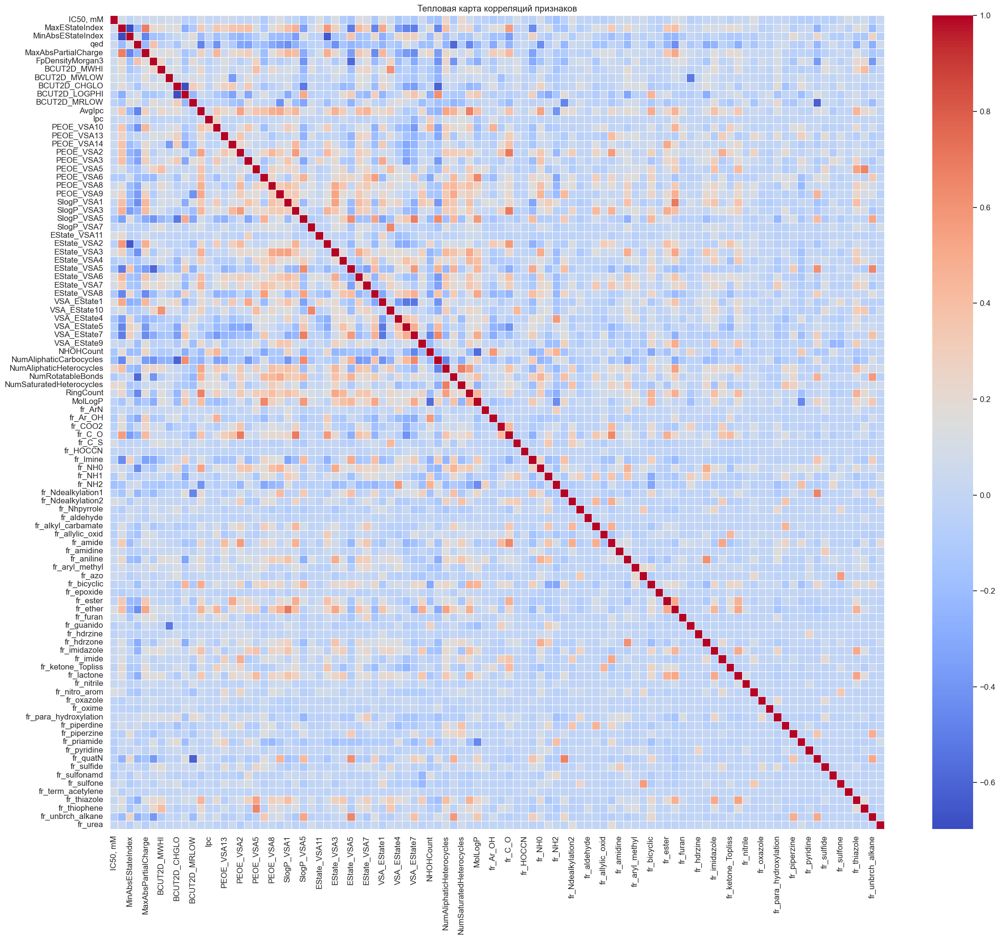

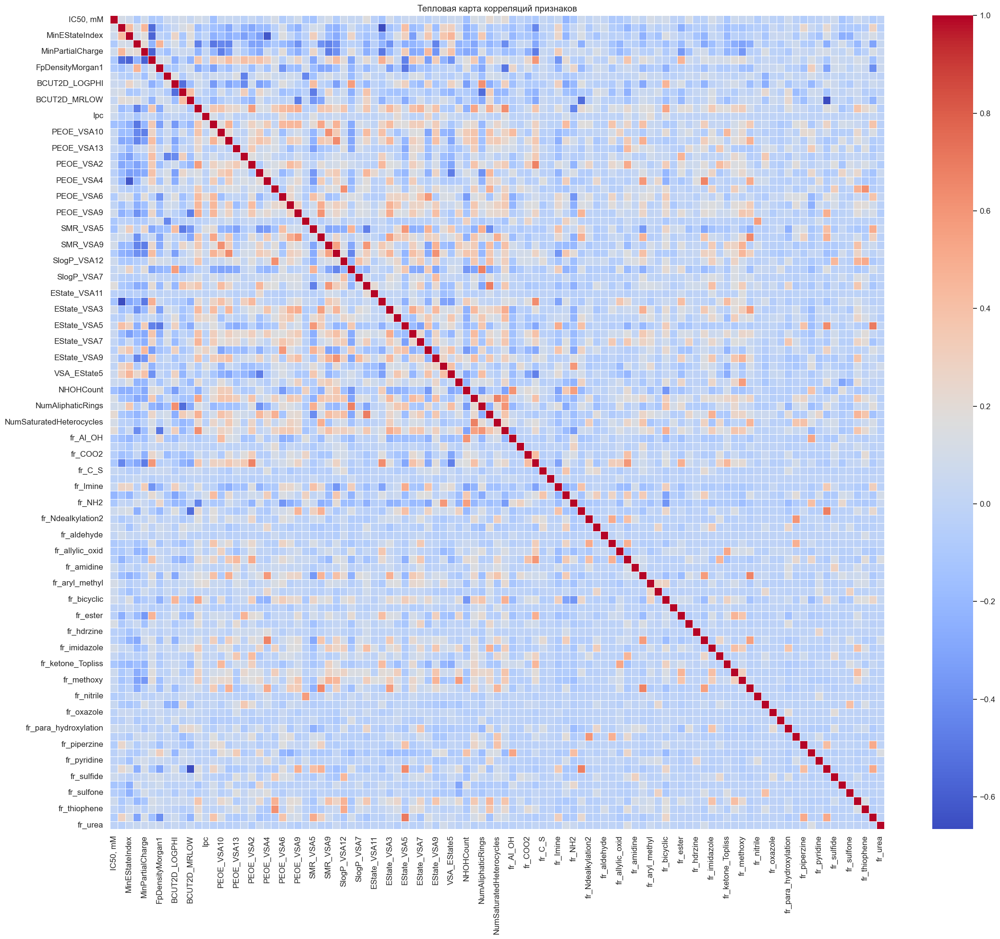

In [392]:
dataset_heatmap(dataset_for_IC50_854)
dataset_heatmap(dataset_for_IC50_567)

In [393]:
# Нормализация признаков в датасете
dataset_for_IC50_567 = normalize_features(dataset_for_IC50_567, 'IC50, mM')

In [394]:
# Итоговый датасет 
dataset_for_IC50_567.head()

,"IC50, mM",MinAbsEStateIndex,MinEStateIndex,qed,MinPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,BCUT2D_MWLOW,BCUT2D_LOGPHI,BCUT2D_LOGPLOW,...,fr_priamide,fr_pyridine,fr_quatN,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_thiazole,fr_thiophene,fr_unbrch_alkane,fr_urea
0,6.239374,1.091581,0.812186,-0.693899,1.417532,-1.461317,-2.027856,-0.041828,0.847207,0.407820,...,-0.196116,-0.170406,-0.201969,-0.239542,-0.111803,-0.08429,-0.23636,-0.232171,1.872373,-0.059496
1,0.771831,1.913962,0.916955,-0.481805,1.169643,-1.675169,-2.176614,-0.057839,0.918887,-0.229360,...,-0.196116,-0.170406,-0.201969,-0.239542,-0.111803,-0.08429,-0.23636,-0.232171,1.872373,-0.059496
3,1.705624,1.110524,0.814599,-0.879689,1.417532,-1.461317,-2.120189,-0.041789,0.847265,0.408853,...,-0.196116,-0.170406,-0.201969,-0.239542,-0.111803,-0.08429,-0.23636,-0.232171,2.564442,-0.059496
5,15.037911,0.479511,0.734210,0.686731,0.105841,-1.263144,-0.706886,-0.041921,0.810227,0.425349,...,-0.196116,-0.170406,-0.201969,-0.239542,-0.111803,-0.08429,-0.23636,-0.232171,-0.203837,-0.059496
6,18.908167,1.329499,0.842496,-1.111507,1.423179,-0.692512,-2.355886,-0.069667,1.047362,-0.882720,...,-0.196116,-0.170406,5.523844,-0.239542,-0.111803,-0.08429,-0.23636,-0.232171,-0.203837,-0.059496


In [395]:
# Нормализация признаков в датасете
dataset_for_IC50_854 = normalize_features(dataset_for_IC50_854, 'IC50, mM')

In [396]:
# Итоговый датасет 
dataset_for_IC50_854.head()

,"IC50, mM",MaxEStateIndex,MinAbsEStateIndex,qed,MaxAbsPartialCharge,FpDensityMorgan3,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGLO,BCUT2D_LOGPHI,...,fr_pyridine,fr_quatN,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_thiazole,fr_thiophene,fr_unbrch_alkane,fr_urea
0,6.239374,-1.626270,1.153533,-0.714779,-1.601280,-2.681275,-0.557429,-0.100145,0.061519,0.937700,...,-0.142515,-0.193651,-0.218226,-0.090909,-0.090909,-0.034239,-0.254633,-0.269934,2.300124,-0.076742
1,0.771831,-1.956637,2.000912,-0.504367,-1.335498,-2.770370,-0.547458,-0.119285,-0.220042,1.015850,...,-0.142515,-0.193651,-0.218226,-0.090909,-0.090909,-0.034239,-0.254633,-0.269934,2.300124,-0.076742
2,223.808778,-2.345811,2.055012,-1.444461,-1.172859,-3.093341,-0.522747,-0.132790,-0.670217,1.134250,...,-0.142515,6.047037,-0.218226,-0.090909,-0.090909,-0.034239,-0.254633,-0.269934,2.300124,-0.076742
3,1.705624,-1.625318,1.173052,-0.899096,-1.601280,-2.708925,-0.557497,-0.100098,0.062596,0.937763,...,-0.142515,-0.193651,-0.218226,-0.090909,-0.090909,-0.034239,-0.254633,-0.269934,3.126852,-0.076742
4,107.131532,-1.609816,0.478902,-0.660316,-2.086361,-2.841647,-0.556852,-0.100288,0.067373,0.959325,...,-0.142515,-0.193651,-0.218226,-0.090909,-0.090909,-0.034239,-0.254633,-0.269934,-0.180060,-0.076742


### 1.2.4 Поиск выбросов в данных в датасете для целевой переменной CC50, mM

In [397]:
# В качестве основы используется изначальный датасет dataset
# В данном датесте уже удалены значения Nan, а также столбец Unnamed: 0
dataset.head()

,"IC50, mM","CC50, mM",SI,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,6.239374,175.482382,28.125000,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,384.652,...,0,0,0,0,0,0,0,0,3,0
1,0.771831,5.402819,7.000000,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,388.684,...,0,0,0,0,0,0,0,0,3,0
2,223.808778,161.142320,0.720000,2.627117,2.627117,0.543231,0.543231,0.260923,42.187500,446.808,...,0,0,0,0,0,0,0,0,3,0
3,1.705624,107.855654,63.235294,5.097360,5.097360,0.390603,0.390603,0.377846,41.862069,398.679,...,0,0,0,0,0,0,0,0,4,0
4,107.131532,139.270991,1.300000,5.150510,5.150510,0.270476,0.270476,0.429038,36.514286,466.713,...,0,0,0,0,0,0,0,0,0,0


In [398]:
### Формирование датасета для целевой переменной CC50, mM, путем удаления столбцов 'IC50, mM', 'SI'

dataset_for_CC50 = dataset.drop(['IC50, mM', 'SI'], axis=1)
dataset_for_CC50.head() 

,"CC50, mM",MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,175.482382,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,384.652,340.300,384.350449,...,0,0,0,0,0,0,0,0,3,0
1,5.402819,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,388.684,340.300,388.381750,...,0,0,0,0,0,0,0,0,3,0
2,161.142320,2.627117,2.627117,0.543231,0.543231,0.260923,42.187500,446.808,388.344,446.458903,...,0,0,0,0,0,0,0,0,3,0
3,107.855654,5.097360,5.097360,0.390603,0.390603,0.377846,41.862069,398.679,352.311,398.366099,...,0,0,0,0,0,0,0,0,4,0
4,139.270991,5.150510,5.150510,0.270476,0.270476,0.429038,36.514286,466.713,424.377,466.334799,...,0,0,0,0,0,0,0,0,0,0


C:\Users\Eve\AppData\Local\Temp\ipykernel_4440\4256989136.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


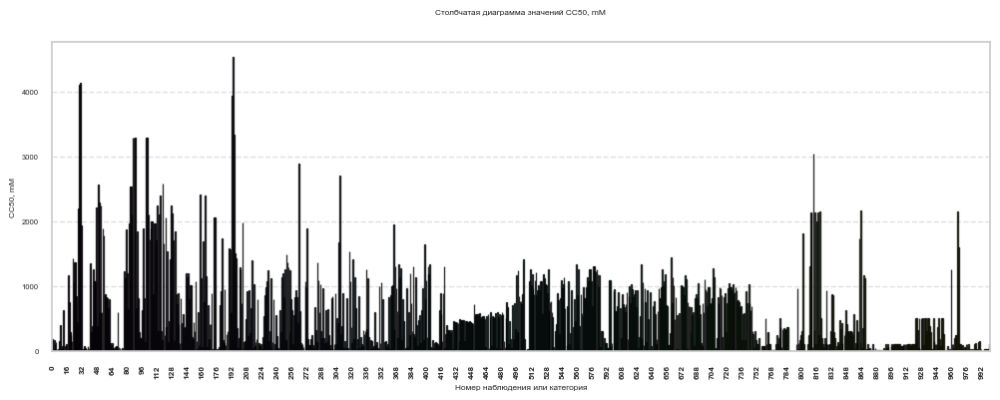

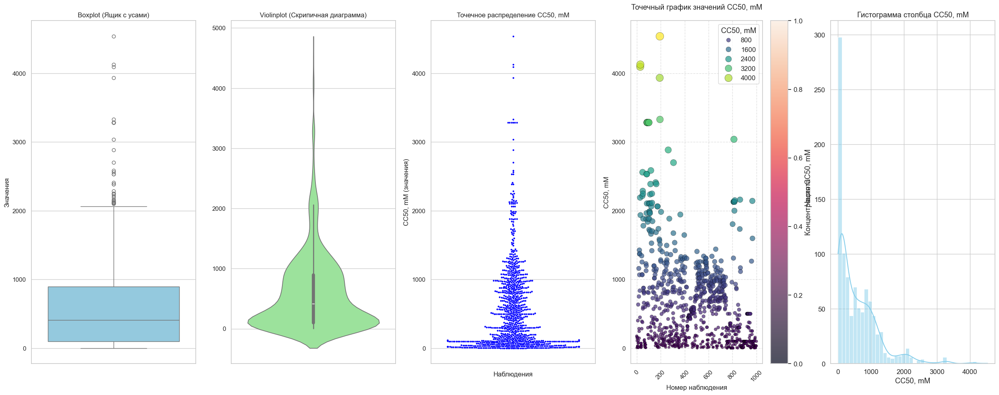

Количество выбросов по CC50, mM: 39
Нижняя граница: -1091.136 по графику Boxplot
Верхняя граница: 2085.224 по графику Boxplot


In [399]:
visualize_column(dataset_for_CC50, 'CC50, mM')

Распределение  для показателя CC50 не является нормальным. 
Графики указывают, что выбросы начинаются после значений примерно 2085. 
Следует выполнить удаление всех строк, содержащих CC50 более 2085. 
Сопоставление графиков также позволяет сделать вывод о возможности выявления 2 классов показателей.

In [400]:
## Сформируем новый датасет, в котором будут только те наблюдения, где CC50 меньше 2085 мМ.

dataset_for_CC50[dataset_for_CC50['CC50, mM'] <= 2085].info()

<class 'pandas.core.frame.DataFrame'>
Index: 962 entries, 0 to 1000
Columns: 211 entries, CC50, mM to fr_urea
dtypes: float64(105), int64(106)
memory usage: 1.6 MB


In [401]:
## Сформируем новый датасет, в котором будут только те наблюдения, где CC50 меньше 2085 мМ.
## Новый датасет будет содержать в названии 854, что соответствует количеству наблюдений в нем.
dataset_for_CC50_962 = dataset_for_CC50[dataset_for_CC50['CC50, mM'] <= 2085]
dataset_for_CC50_962.info()

<class 'pandas.core.frame.DataFrame'>
Index: 962 entries, 0 to 1000
Columns: 211 entries, CC50, mM to fr_urea
dtypes: float64(105), int64(106)
memory usage: 1.6 MB


Получен датасет объем 962 записей. Данный датасет сохранен отдельно для дальнейшего использования.

C:\Users\Eve\AppData\Local\Temp\ipykernel_4440\4256989136.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


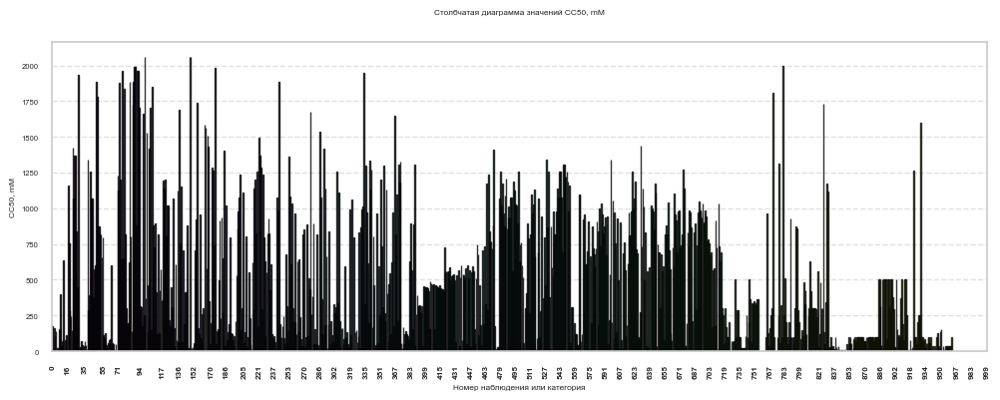

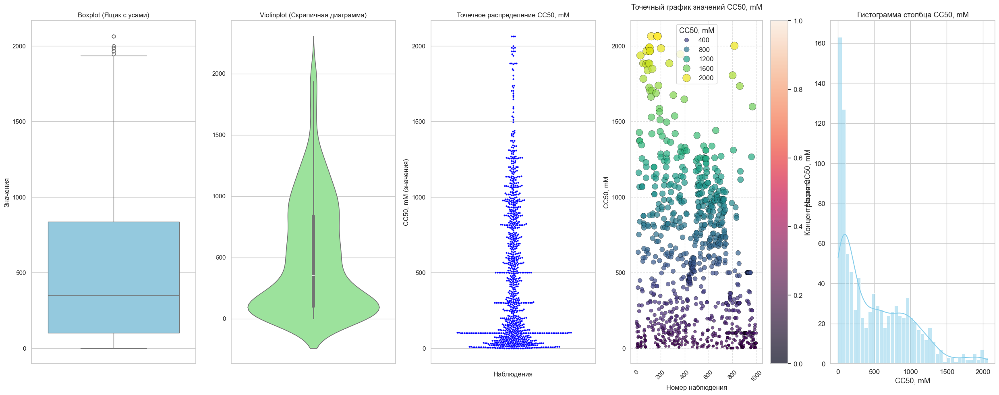

Количество выбросов по CC50, mM: 11
Нижняя граница: -1004.427 по графику Boxplot
Верхняя граница: 1940.708 по графику Boxplot


In [402]:
visualize_column(dataset_for_CC50_962, 'CC50, mM')

Так как и в случае с показателем IC50, показатель CC50 также не может быть полностью избавлен от выбросов за одно преобрвазование.

In [403]:
# Сокращаем количество выбросов до 0 с помощью функции remove_all_outliers, сохраняем новый датасет.
dataset_for_CC50_950 = remove_all_outliers(dataset_for_CC50_962, 'CC50, mM')
dataset_for_CC50_950.info()

Верхняя граница: 1940.708, выбросов сверху: 11
Верхняя граница: 1906.833, выбросов сверху: 1
Верхняя граница: 1903.485, выбросов сверху: 0
Всего удалено строк: 12
<class 'pandas.core.frame.DataFrame'>
Index: 950 entries, 0 to 1000
Columns: 211 entries, CC50, mM to fr_urea
dtypes: float64(105), int64(106)
memory usage: 1.5 MB


C:\Users\Eve\AppData\Local\Temp\ipykernel_4440\4256989136.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


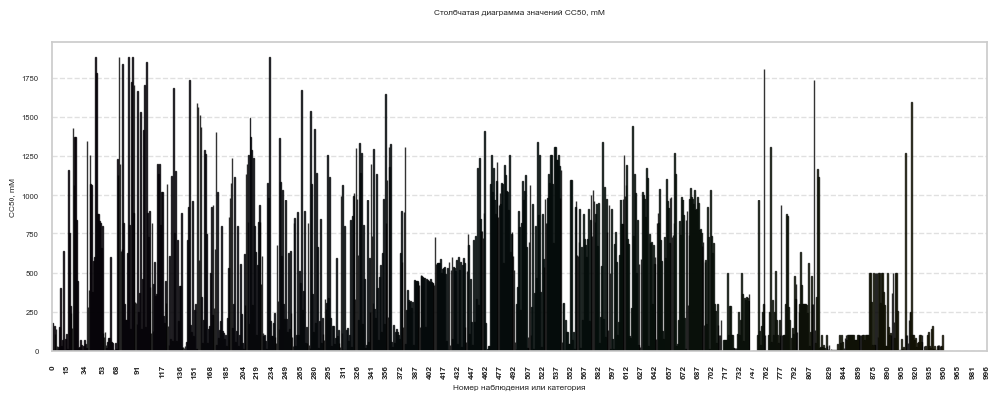

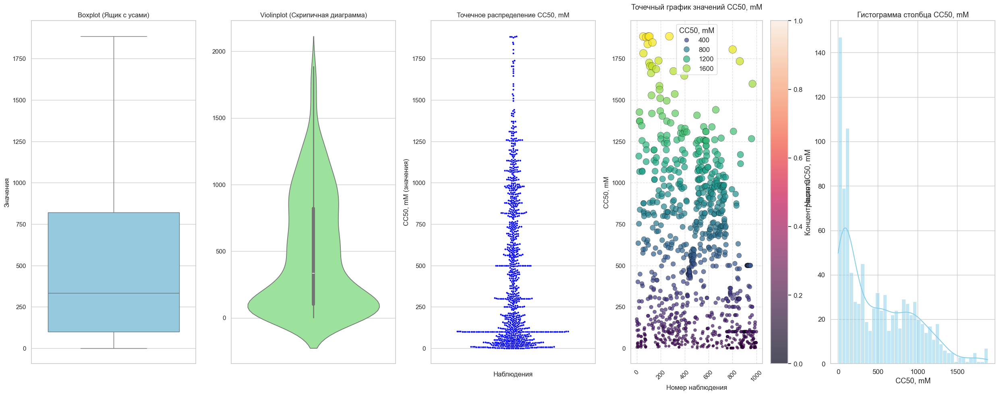

Количество выбросов по CC50, mM: 0
Нижняя граница: -982.095 по графику Boxplot
Верхняя граница: 1903.485 по графику Boxplot


In [404]:
# Вывод информации о столбцах dataset_for_CC50_962
visualize_column(dataset_for_CC50_950, 'CC50, mM')

Как видно из графика выбросы  для значений CC50 не наблюдаются при объеме датасета в размере 950.
Поскольку разница в объеме датасетов dataset_for_CC50_960 и dataset_for_CC50_950 незначительная.

Для дальнейшей работы будет использоваться датасет: dataset_for_CC50_950




### 1.2.5 Исследование корреляции признаков в датасете для целевой переменной CC50, mM

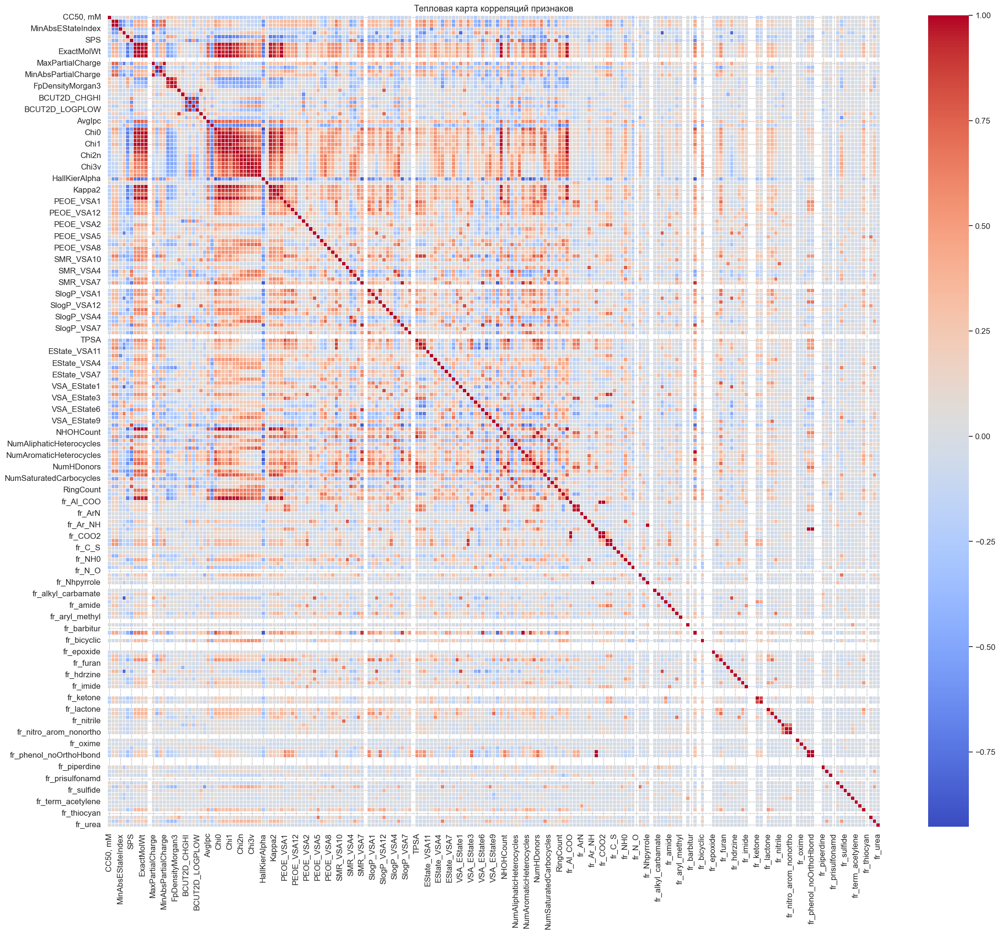

In [405]:
# Отображение тепловой карты корреляций признаков для dataset_for_СC50_950, для целевой переменной СC50, mM
dataset_heatmap(dataset_for_CC50_950)

Так же как и в случае с показателем IC50, основная корреляция для признака СС50 находится в условном верхнем левом квадрате матрицы.

In [406]:
# Вывод признаков, коррелирующих с целевой переменной CC50, mM
print("Корреляция признаков с целевой переменной CC50, mM для датасета dataset_for_CC50_950:")
target_corr(dataset_for_CC50_950, 'CC50, mM')

Корреляция признаков с целевой переменной CC50, mM для датасета dataset_for_CC50_950:
Корреляция признаков с целевым столбцом 'CC50, mM':
VSA_EState4        -0.245125
fr_NH2             -0.230569
FpDensityMorgan1    0.225688
PEOE_VSA7          -0.218992
Kappa3             -0.214545
                      ...   
fr_nitroso               NaN
fr_phos_acid             NaN
fr_phos_ester            NaN
fr_prisulfonamd          NaN
fr_thiocyan              NaN
Name: CC50, mM, Length: 210, dtype: float64


Также среди признаков имеется корреляци со значениями NaN, которые нужно будет удалить.

In [407]:
### Удаление все признаки, корреляиция которых с целевой переменной CC50, mM равна NaN из обоих датасетов.
dataset_for_CC50_950 = target_corr_clean(dataset_for_CC50_950, 'CC50, mM')

Удалены столбцы с NaN корреляцией с 'CC50, mM': ['NumRadicalElectrons', 'SMR_VSA8', 'SlogP_VSA9', 'fr_N_O', 'fr_SH', 'fr_azide', 'fr_barbitur', 'fr_benzodiazepine', 'fr_diazo', 'fr_dihydropyridine', 'fr_isocyan', 'fr_isothiocyan', 'fr_lactam', 'fr_nitroso', 'fr_phos_acid', 'fr_phos_ester', 'fr_prisulfonamd', 'fr_thiocyan']
Корреляция признаков с целевым столбцом 'CC50, mM':
VSA_EState4        -0.245125
fr_NH2             -0.230569
FpDensityMorgan1    0.225688
PEOE_VSA7          -0.218992
Kappa3             -0.214545
                      ...   
VSA_EState10       -0.003858
fr_thiophene        0.003665
VSA_EState9         0.002200
fr_imide           -0.002019
PEOE_VSA13          0.000097
Name: CC50, mM, Length: 192, dtype: float64


In [408]:
# Проверка корректности преобразования
target_corr(dataset_for_CC50_950, 'CC50, mM')

Корреляция признаков с целевым столбцом 'CC50, mM':
VSA_EState4        -0.245125
fr_NH2             -0.230569
FpDensityMorgan1    0.225688
PEOE_VSA7          -0.218992
Kappa3             -0.214545
                      ...   
VSA_EState10       -0.003858
fr_thiophene        0.003665
VSA_EState9         0.002200
fr_imide           -0.002019
PEOE_VSA13          0.000097
Name: CC50, mM, Length: 192, dtype: float64


Удалены признаки с высокой взаимной корреляцией (>0.7): ['Kappa2', 'NumSaturatedRings', 'RingCount', 'fr_C_O_noCOO', 'VSA_EState6', 'MaxAbsEStateIndex', 'NumSaturatedCarbocycles', 'fr_Ar_OH', 'fr_ether', 'BalabanJ', 'FpDensityMorgan3', 'Chi0v', 'VSA_EState10', 'TPSA', 'FpDensityMorgan2', 'BCUT2D_MWHI', 'fr_COO2', 'fr_phenol', 'SPS', 'SlogP_VSA6', 'SMR_VSA3', 'HeavyAtomMolWt', 'NumRotatableBonds', 'Chi1n', 'SlogP_VSA4', 'MolMR', 'EState_VSA1', 'SMR_VSA4', 'Chi1', 'PEOE_VSA1', 'Chi3v', 'fr_methoxy', 'NumAromaticHeterocycles', 'MinAbsPartialCharge', 'NOCount', 'AvgIpc', 'SlogP_VSA12', 'Chi0', 'fr_Al_OH', 'Chi4v', 'VSA_EState2', 'NumAromaticCarbocycles', 'BCUT2D_LOGPHI', 'VSA_EState1', 'PEOE_VSA2', 'EState_VSA9', 'fr_COO', 'Chi0n', 'EState_VSA10', 'Chi4n', 'Chi3n', 'MaxAbsPartialCharge', 'BertzCT', 'SlogP_VSA2', 'NumAliphaticRings', 'qed', 'NumValenceElectrons', 'NumAliphaticHeterocycles', 'fr_Al_OH_noTert', 'PEOE_VSA11', 'fr_Ar_NH', 'SMR_VSA7', 'MinEStateIndex', 'HeavyAtomCount', 'Chi2v',

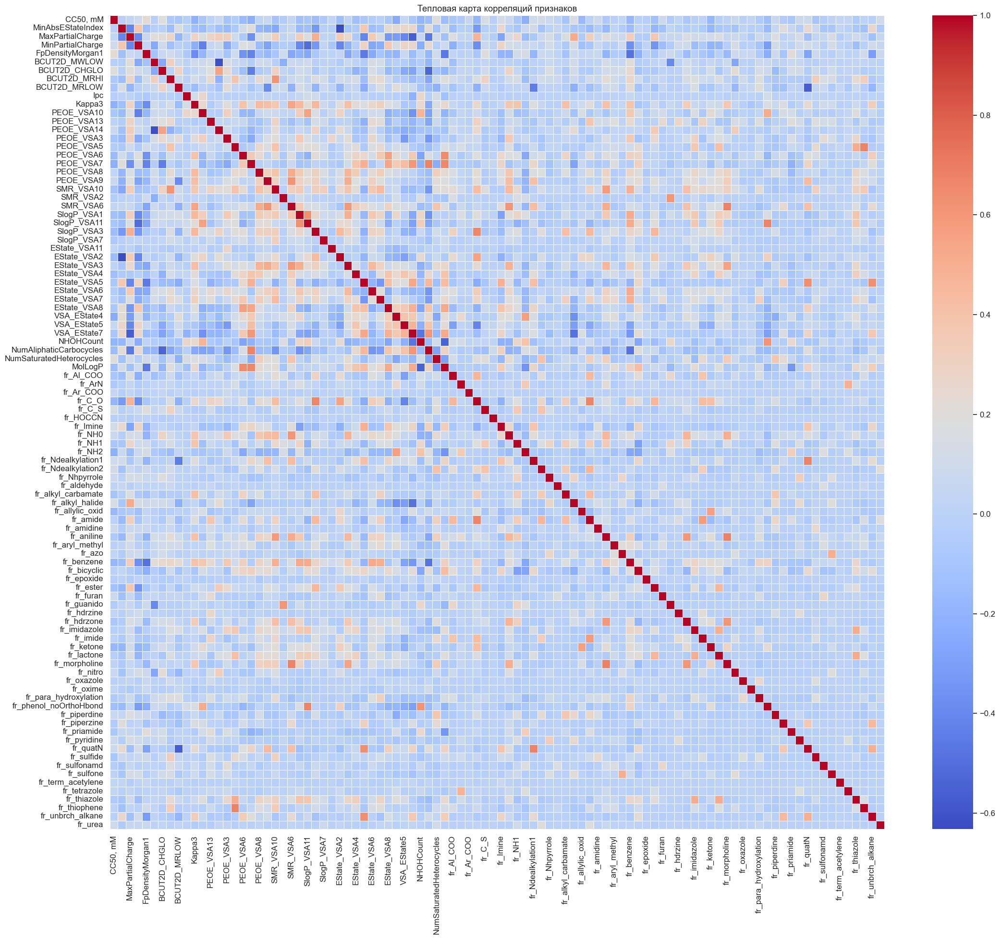

In [409]:
# С помощью функции remove_highly_correlated_features находим и удаляем признаки, степень корреляиции которых между собой 
#  более (|corr| > 0.7).
dataset_for_CC50_950, dropped = remove_highly_correlated_features(dataset_for_CC50_950, 'CC50, mM')
dataset_heatmap(dataset_for_CC50_950)


In [410]:
# Вывод признаков, коррелирующих с целевой переменной CC50, mM после удаления NaN корреляции
dataset_for_CC50_950 = normalize_features(dataset_for_CC50_950, 'CC50, mM')

In [411]:
# Итоговый датасет dataset_for_CC50_950, который будет использоваться для обучения модели
dataset_for_CC50_950.head()

,"CC50, mM",MinAbsEStateIndex,MaxPartialCharge,MinPartialCharge,FpDensityMorgan1,BCUT2D_MWLOW,BCUT2D_CHGLO,BCUT2D_MRHI,BCUT2D_MRLOW,Ipc,...,fr_quatN,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiophene,fr_unbrch_alkane,fr_urea
0,175.482382,1.283199,-1.552119,1.452019,-2.053758,-0.077727,0.009937,-0.300025,1.105478,-0.039509,...,-0.165714,-0.209012,-0.113107,-0.097797,-0.032461,-0.032461,-0.240638,-0.282038,2.309038,-0.079724
1,5.402819,2.174693,-1.753733,1.201427,-2.203768,-0.093332,-0.233121,-0.997559,0.796288,-0.039509,...,-0.165714,-0.209012,-0.113107,-0.097797,-0.032461,-0.032461,-0.240638,-0.282038,2.309038,-0.079724
2,161.142320,2.231610,-1.117481,1.048084,-2.391281,-0.104343,-0.621735,-1.012492,-3.612691,-0.039504,...,6.533361,-0.209012,-0.113107,-0.097797,-0.032461,-0.032461,-0.240638,-0.282038,2.309038,-0.079724
3,107.855654,1.303735,-1.552119,1.452019,-2.146868,-0.077689,0.010867,-0.300040,1.105603,-0.039508,...,-0.165714,-0.209012,-0.113107,-0.097797,-0.032461,-0.032461,-0.240638,-0.282038,3.134625,-0.079724
4,139.270991,0.573447,-1.365287,1.909375,-2.233770,-0.077844,0.014990,-0.283724,1.106348,-0.039429,...,-0.165714,-0.209012,-0.113107,-0.097797,-0.032461,-0.032461,-0.240638,-0.282038,-0.167725,-0.079724


### 1.2.6 Поиск выбросов в данных в датасете для целевой переменной SI


In [412]:
# Для формирования датасет для признака SI используется основной датасет - dataset
dataset.head()

# Формируется новый датасет с одной целевой переменной SI
dataset_for_SI = dataset.drop(['CC50, mM', 'IC50, mM'], axis=1)
dataset_for_SI.head() 


,SI,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,28.125000,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,384.652,340.300,384.350449,...,0,0,0,0,0,0,0,0,3,0
1,7.000000,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,388.684,340.300,388.381750,...,0,0,0,0,0,0,0,0,3,0
2,0.720000,2.627117,2.627117,0.543231,0.543231,0.260923,42.187500,446.808,388.344,446.458903,...,0,0,0,0,0,0,0,0,3,0
3,63.235294,5.097360,5.097360,0.390603,0.390603,0.377846,41.862069,398.679,352.311,398.366099,...,0,0,0,0,0,0,0,0,4,0
4,1.300000,5.150510,5.150510,0.270476,0.270476,0.429038,36.514286,466.713,424.377,466.334799,...,0,0,0,0,0,0,0,0,0,0


C:\Users\Eve\AppData\Local\Temp\ipykernel_4440\4256989136.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


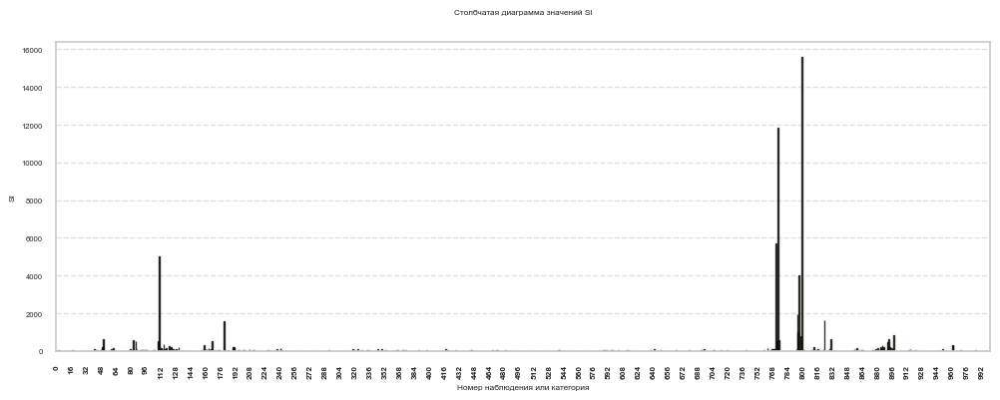

C:\Users\Eve\AppData\Roaming\Python\Python312\site-packages\seaborn\categorical.py:3399: UserWarning: 37.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Eve\AppData\Roaming\Python\Python312\site-packages\seaborn\categorical.py:3399: UserWarning: 84.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


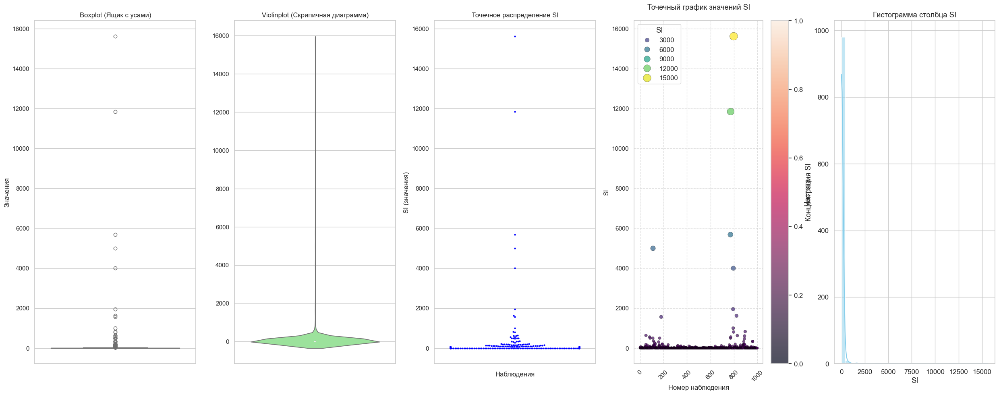

Количество выбросов по SI: 125
Нижняя граница: -21.267 по графику Boxplot
Верхняя граница: 39.267 по графику Boxplot


In [413]:
# Визуализация данных о распределении значений для целевой перменной SI

visualize_column(dataset_for_SI, 'SI')

Полученные графики указывают на то, что распределение значений для показателя SI не является нормальным. 
Из графиков выброс для целевой переменной SI начинаются после значений 39. Следует удалить строки, в которых указанное значение менее 39.

In [414]:
## Сформируем новый датасет, в котором будут только те наблюдения, где SI меньше 39 мМ.
## Новый датасет будет содержать в названии 876, что соответствует количеству наблюдений в нем.
dataset_for_SI_876 = dataset_for_SI[dataset_for_SI['SI'] <= 39]

dataset_for_SI_876.info()

<class 'pandas.core.frame.DataFrame'>
Index: 876 entries, 0 to 1000
Columns: 211 entries, SI to fr_urea
dtypes: float64(105), int64(106)
memory usage: 1.4 MB


В результате удаления строк, содержащих выброс объем изначального датастета снизился до 876

C:\Users\Eve\AppData\Local\Temp\ipykernel_4440\4256989136.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


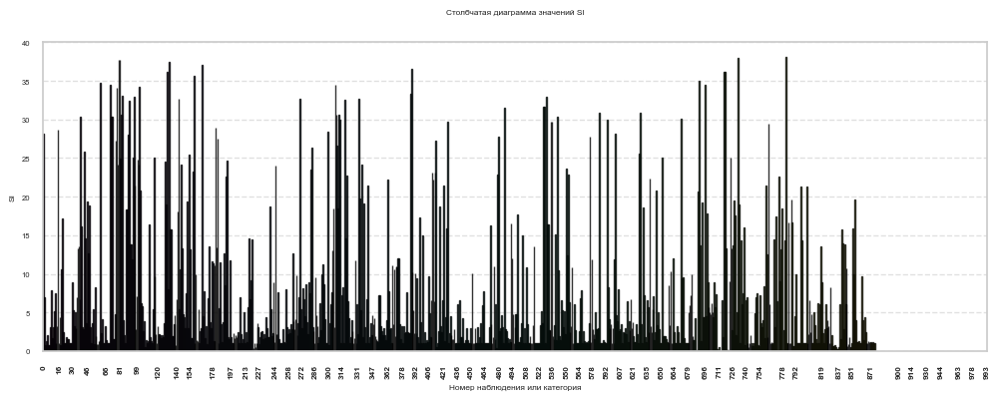

C:\Users\Eve\AppData\Roaming\Python\Python312\site-packages\seaborn\categorical.py:3399: UserWarning: 9.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


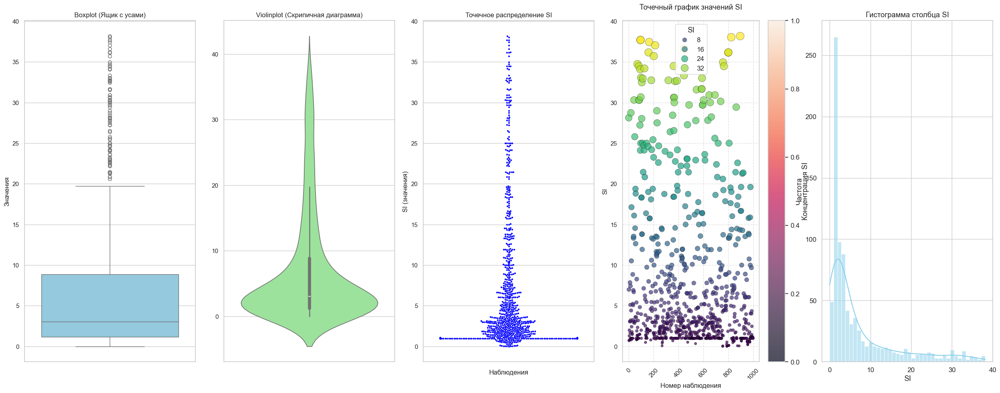

Количество выбросов по SI: 97
Нижняя граница: -10.296 по графику Boxplot
Верхняя граница: 20.347 по графику Boxplot


In [415]:
# Вывод информации о столбцах датасета dataset_for_SI_876
visualize_column(dataset_for_SI_876, 'SI')

Поскольку после однократного преобразования датасета выбросы не устраняются следует применить функцию для удаления всех выбросов: remove_all_outliers

In [416]:
# Сокращаем количество выбросов до 0 с помощью функции remove_all_outliers
# Если сократить количество выбросов до 0, то в датасете останется 567 строк.
dataset_for_SI_588 = remove_all_outliers(dataset_for_SI_876, 'SI')
dataset_for_SI_588.info()


Верхняя граница: 20.347, выбросов сверху: 97
Верхняя граница: 13.568, выбросов сверху: 58
Верхняя граница: 10.423, выбросов сверху: 40
Верхняя граница: 8.622, выбросов сверху: 29
Верхняя граница: 7.509, выбросов сверху: 19
Верхняя граница: 7.181, выбросов сверху: 12
Верхняя граница: 6.751, выбросов сверху: 10
Верхняя граница: 6.462, выбросов сверху: 17
Верхняя граница: 6.239, выбросов сверху: 3
Верхняя граница: 6.196, выбросов сверху: 2
Верхняя граница: 6.153, выбросов сверху: 1
Верхняя граница: 6.138, выбросов сверху: 0
Всего удалено строк: 288
<class 'pandas.core.frame.DataFrame'>
Index: 588 entries, 2 to 1000
Columns: 211 entries, SI to fr_urea
dtypes: float64(105), int64(106)
memory usage: 973.9 KB


C:\Users\Eve\AppData\Local\Temp\ipykernel_4440\4256989136.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


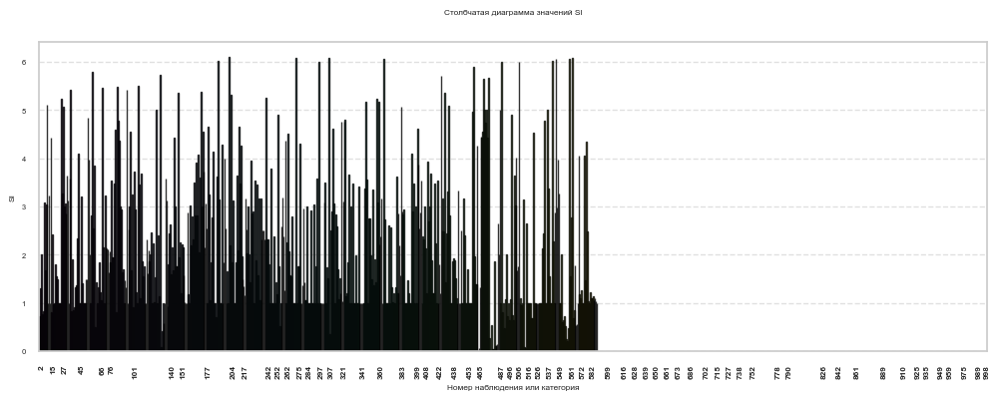

C:\Users\Eve\AppData\Roaming\Python\Python312\site-packages\seaborn\categorical.py:3399: UserWarning: 10.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


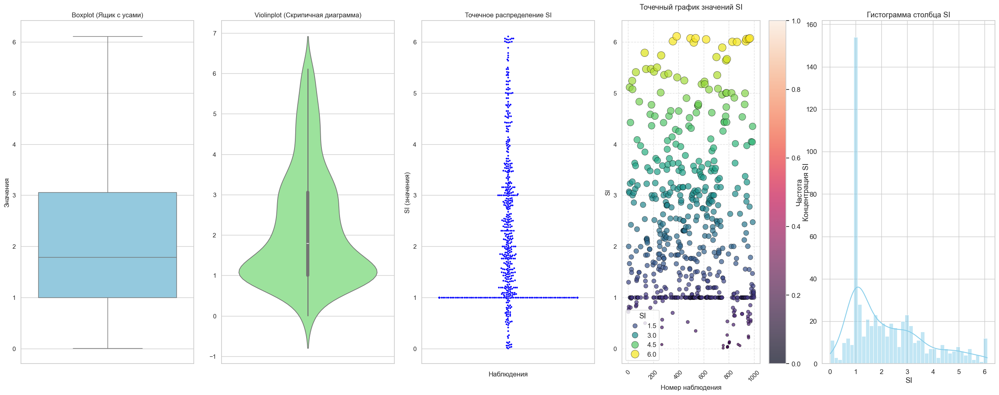

Количество выбросов по SI: 0
Нижняя граница: -2.083 по графику Boxplot
Верхняя граница: 6.138 по графику Boxplot


In [417]:
visualize_column(dataset_for_SI_588, 'SI')

Очевидно, что в данных имееется показатель равный 1. Данный показатель соответсвует записями в которых показатели CC и IC равны между собой. Данные записи удалять не следует.
В результате преобрвазования получено 2 датасета, которые будут использоваться для обучения моделей в дальнейшем: 

dataset_for_SI_876; 
dataset_for_SI_588 (данный датасет представляется мнее подходящим ввиду малого объема).


### 1.2.7 Исследование корреляции признаков в датасете для целевой переменной SI

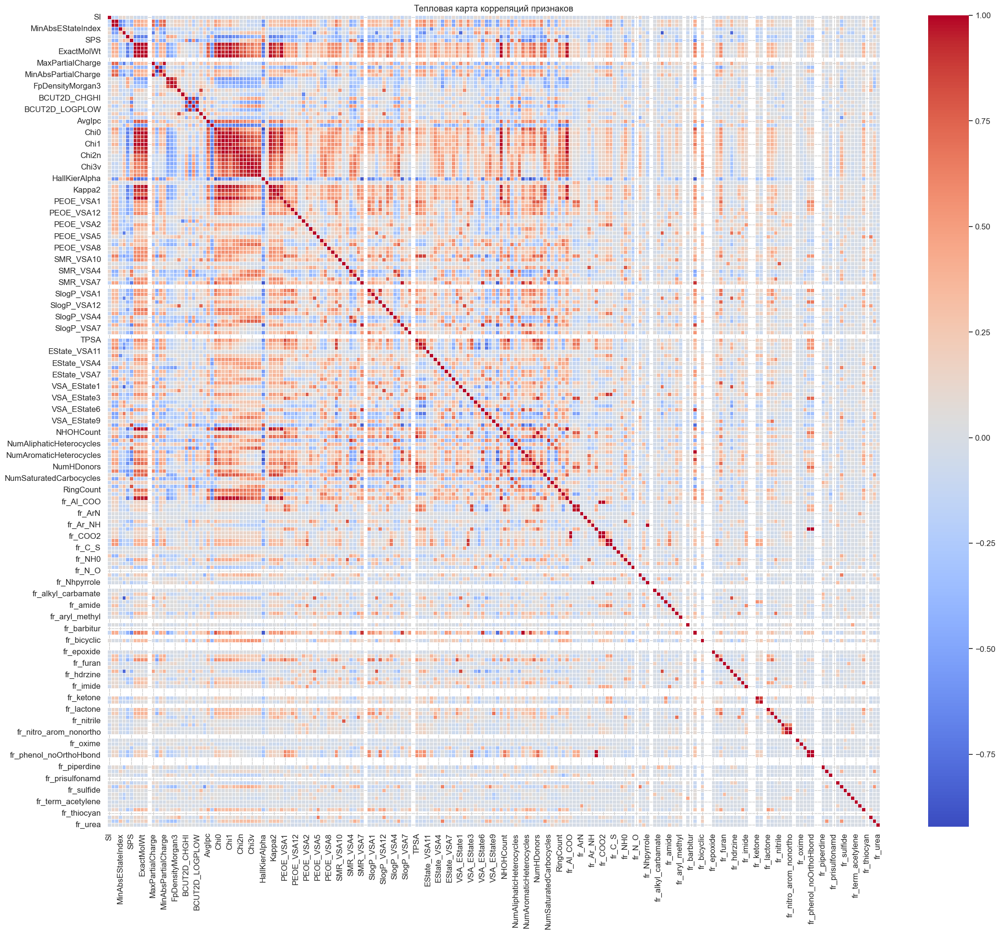

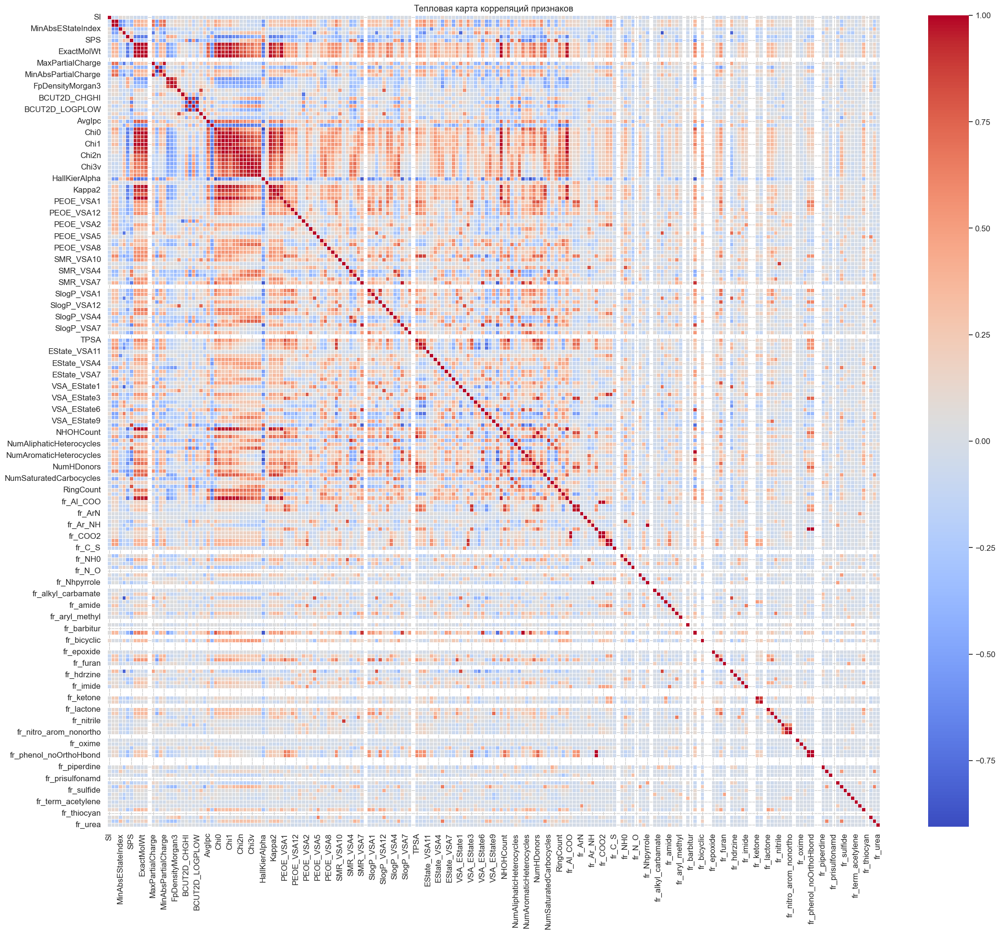

In [418]:
# Отображение тепловой карты корреляций признаков для dataset_for_SI_876, dataset_for_SI_588
# для целевой переменной SI
dataset_heatmap(dataset_for_SI_876)
dataset_heatmap(dataset_for_SI_588)


Как видно из тепловых карт указанных датасетов целевая перменная SI слабо коррелирует с отальными признаками

In [419]:
# Вывод признаков, коррелирующих с целевой переменной SI, mM
print("Корреляция признаков с целевой переменной SI, mM для датасета dataset_for_SI_876:")
target_corr(dataset_for_SI_876, 'SI')

print("\nКорреляция признаков с целевой переменной IC50, mM для датасета dataset_for_SI_588:")
target_corr(dataset_for_SI_588, 'SI')

Корреляция признаков с целевой переменной SI, mM для датасета dataset_for_SI_876:
Корреляция признаков с целевым столбцом 'SI':
fr_Imine             0.248316
VSA_EState8          0.181645
FractionCSP3         0.164369
fr_Ndealkylation1    0.158560
MaxAbsEStateIndex   -0.153195
                       ...   
fr_nitroso                NaN
fr_phos_acid              NaN
fr_phos_ester             NaN
fr_prisulfonamd           NaN
fr_thiocyan               NaN
Name: SI, Length: 210, dtype: float64

Корреляция признаков с целевой переменной IC50, mM для датасета dataset_for_SI_588:
Корреляция признаков с целевым столбцом 'SI':
MinAbsPartialCharge   -0.154862
SlogP_VSA2            -0.144809
NOCount               -0.144757
MaxPartialCharge      -0.143489
EState_VSA5            0.140017
                         ...   
fr_nitroso                  NaN
fr_phos_acid                NaN
fr_phos_ester               NaN
fr_prisulfonamd             NaN
fr_thiocyan                 NaN
Name: SI, Length: 210

Имеются признаки, корреляция которых с целевым показателем SI, имеет значение NaN. Данные признаки подлежат удалению.

In [420]:
### Удалим все признаки, корреляиция которых с целевой переменной SI равна NaN из обоих датасетов.
dataset_for_SI_876 = target_corr_clean(dataset_for_SI_876, 'SI')
dataset_for_SI_588 = target_corr_clean(dataset_for_SI_588, 'SI')

Удалены столбцы с NaN корреляцией с 'SI': ['NumRadicalElectrons', 'SMR_VSA8', 'SlogP_VSA9', 'fr_N_O', 'fr_SH', 'fr_azide', 'fr_barbitur', 'fr_benzodiazepine', 'fr_diazo', 'fr_dihydropyridine', 'fr_isocyan', 'fr_isothiocyan', 'fr_lactam', 'fr_nitroso', 'fr_phos_acid', 'fr_phos_ester', 'fr_prisulfonamd', 'fr_thiocyan']
Корреляция признаков с целевым столбцом 'SI':
fr_Imine             0.248316
VSA_EState8          0.181645
FractionCSP3         0.164369
fr_Ndealkylation1    0.158560
MaxAbsEStateIndex   -0.153195
                       ...   
fr_Ar_N              0.002777
Chi1n               -0.002614
PEOE_VSA9           -0.002263
BCUT2D_MRLOW        -0.001788
fr_piperzine         0.001471
Name: SI, Length: 192, dtype: float64
Удалены столбцы с NaN корреляцией с 'SI': ['NumRadicalElectrons', 'SMR_VSA8', 'SlogP_VSA9', 'fr_HOCCN', 'fr_N_O', 'fr_SH', 'fr_azide', 'fr_barbitur', 'fr_benzodiazepine', 'fr_diazo', 'fr_dihydropyridine', 'fr_guanido', 'fr_isocyan', 'fr_isothiocyan', 'fr_lactam', 'fr

In [421]:
# Проверка корректности преобразования.
target_corr(dataset_for_SI_876, 'SI')
target_corr(dataset_for_SI_588, 'SI')

Корреляция признаков с целевым столбцом 'SI':
fr_Imine             0.248316
VSA_EState8          0.181645
FractionCSP3         0.164369
fr_Ndealkylation1    0.158560
MaxAbsEStateIndex   -0.153195
                       ...   
fr_Ar_N              0.002777
Chi1n               -0.002614
PEOE_VSA9           -0.002263
BCUT2D_MRLOW        -0.001788
fr_piperzine         0.001471
Name: SI, Length: 192, dtype: float64
Корреляция признаков с целевым столбцом 'SI':
MinAbsPartialCharge   -0.154862
SlogP_VSA2            -0.144809
NOCount               -0.144757
MaxPartialCharge      -0.143489
EState_VSA5            0.140017
                         ...   
BCUT2D_MRHI            0.000899
PEOE_VSA8              0.000643
BCUT2D_CHGLO           0.000451
fr_oxime               0.000130
SMR_VSA4               0.000080
Name: SI, Length: 190, dtype: float64


In [422]:
# С помощью функции remove_highly_correlated_features находим и удаляем признаки, степень корреляиции которых между собой 
#  более (|corr| > 0.7).
dataset_for_SI_876, dropped = remove_highly_correlated_features(dataset_for_SI_876, 'SI')
dataset_for_SI_588, dropped = remove_highly_correlated_features(dataset_for_SI_588, 'SI')

Удалены признаки с высокой взаимной корреляцией (>0.7): ['Kappa2', 'NumSaturatedRings', 'RingCount', 'VSA_EState6', 'MaxAbsEStateIndex', 'NumSaturatedCarbocycles', 'fr_Ar_OH', 'NumSaturatedHeterocycles', 'BalabanJ', 'VSA_EState10', 'Chi0v', 'SlogP_VSA11', 'TPSA', 'FpDensityMorgan2', 'fr_COO2', 'fr_phenol', 'Kappa3', 'SPS', 'SlogP_VSA6', 'SMR_VSA3', 'HeavyAtomMolWt', 'fr_phenol_noOrthoHbond', 'Chi1n', 'SlogP_VSA4', 'MolMR', 'EState_VSA1', 'fr_C_O', 'SMR_VSA4', 'Chi1', 'PEOE_VSA1', 'Chi3v', 'fr_methoxy', 'NumAromaticHeterocycles', 'MinAbsPartialCharge', 'NOCount', 'FpDensityMorgan1', 'AvgIpc', 'SlogP_VSA12', 'BCUT2D_MRHI', 'Chi0', 'fr_benzene', 'fr_Al_OH', 'Chi4v', 'VSA_EState2', 'NumAromaticCarbocycles', 'VSA_EState1', 'PEOE_VSA2', 'EState_VSA9', 'BCUT2D_CHGLO', 'fr_COO', 'Chi0n', 'Chi4n', 'NHOHCount', 'Chi3n', 'BertzCT', 'SlogP_VSA2', 'NumAliphaticRings', 'NumValenceElectrons', 'fr_Al_OH_noTert', 'PEOE_VSA11', 'NumAliphaticCarbocycles', 'fr_Ar_NH', 'SMR_VSA7', 'PEOE_VSA7', 'fr_alkyl_ha

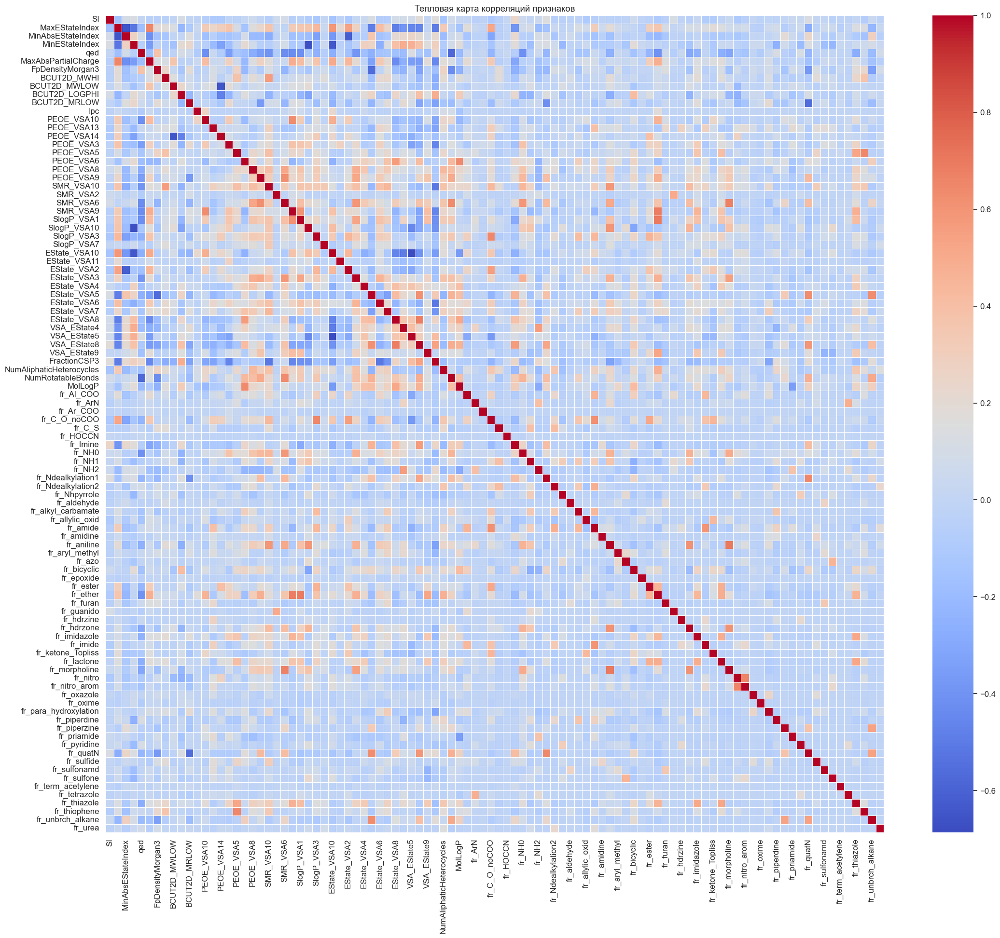

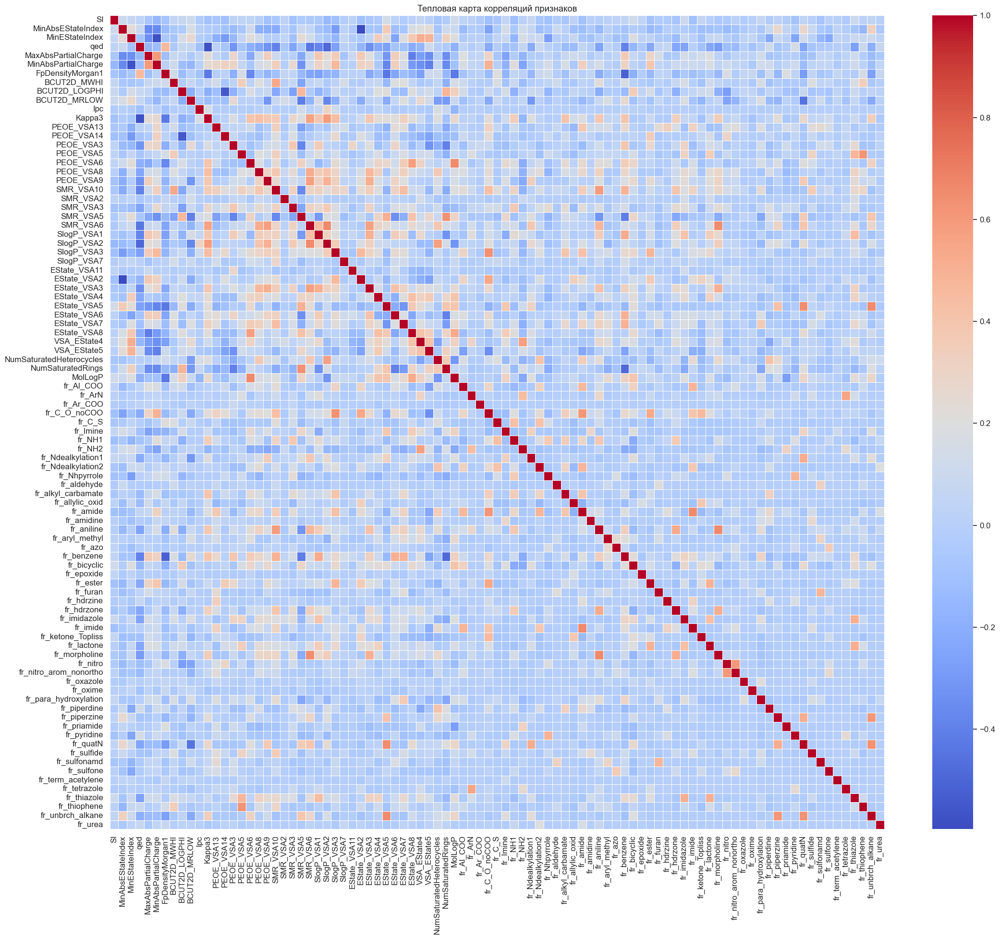

In [423]:
dataset_heatmap(dataset_for_SI_876)
dataset_heatmap(dataset_for_SI_588)

In [424]:
# Нормализация признаков в датасетах
dataset_for_SI_876 = normalize_features(dataset_for_SI_876, 'SI')
dataset_for_SI_588 = normalize_features(dataset_for_SI_588, 'SI')

In [425]:
dataset_for_SI_588.head()

,SI,MinAbsEStateIndex,MinEStateIndex,qed,MaxAbsPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,BCUT2D_MWHI,BCUT2D_LOGPHI,BCUT2D_MRLOW,...,fr_quatN,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiophene,fr_unbrch_alkane,fr_urea
2,0.72,2.219433,1.010896,-1.480657,-1.222469,-1.203421,-2.358568,-0.549777,1.074318,-3.690530,...,6.928713,-0.219382,-0.092608,-0.101535,-0.041274,-0.041274,-0.219382,-0.294748,2.364775,-0.071611
4,1.30,0.586044,0.848677,-0.695292,-2.136001,-1.475175,-2.201844,-0.583322,0.930748,1.170889,...,-0.132090,-0.219382,-0.092608,-0.101535,-0.041274,-0.041274,-0.219382,-0.294748,-0.127138,-0.071611
5,2.00,0.631598,0.853201,0.621971,-0.244484,-1.475175,-0.697289,-0.583980,0.879909,1.170953,...,-0.132090,-0.219382,-0.092608,-0.101535,-0.041274,-0.041274,-0.219382,-0.294748,-0.127138,-0.071611
6,0.77,1.539252,0.943344,-1.164781,-1.656959,-0.885210,-2.351871,-0.549323,1.092105,0.648040,...,6.928713,-0.219382,-0.092608,-0.101535,-0.041274,-0.041274,-0.219382,-0.294748,-0.127138,-0.071611
7,0.82,-0.555548,0.508641,-1.684294,-0.820744,-0.088024,-2.169065,-0.498517,0.636753,-0.278006,...,-0.132090,-0.219382,-0.092608,-0.101535,-0.041274,-0.041274,-0.219382,-0.294748,3.195413,-0.071611


In [426]:
dataset_for_SI_876.head()

,SI,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,MaxAbsPartialCharge,FpDensityMorgan3,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_LOGPHI,...,fr_quatN,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiophene,fr_unbrch_alkane,fr_urea
0,28.125,-1.775193,1.197465,0.860794,-0.742253,-1.639044,-2.776594,-0.582925,-0.179932,0.918201,...,-0.174217,-0.220766,-0.089751,-0.089751,-0.033806,-0.033806,-0.243414,-0.278372,2.664004,-0.075766
1,7.000,-2.118303,2.051718,0.951504,-0.530202,-1.374355,-2.866633,-0.572594,-0.201291,0.988075,...,-0.174217,-0.220766,-0.089751,-0.089751,-0.033806,-0.033806,-0.243414,-0.278372,2.664004,-0.075766
2,0.720,-2.522488,2.106256,0.957295,-1.477619,-1.212386,-3.193023,-0.546986,-0.216363,1.093939,...,6.461194,-0.220766,-0.089751,-0.089751,-0.033806,-0.033806,-0.243414,-0.278372,2.664004,-0.075766
4,1.300,-1.758104,0.517362,0.788576,-0.687365,-2.122128,-2.938664,-0.582327,-0.180092,0.937535,...,-0.174217,-0.220766,-0.089751,-0.089751,-0.033806,-0.033806,-0.243414,-0.278372,-0.140885,-0.075766
5,2.000,-1.573960,0.561675,0.793281,0.638096,-0.238459,-0.864172,-0.583020,-0.180056,0.882152,...,-0.174217,-0.220766,-0.089751,-0.089751,-0.033806,-0.033806,-0.243414,-0.278372,-0.140885,-0.075766


### 1.2.8 Формирование и исследование датасета для классификации значения медианы IC50, СС50, SI

Для решения задачи классификации целевой переменной IC50 в части превышения медианного значения будет построено следующим образом: 
1. Вычисление медианы для показателя IC50 по всем датасету
2. Формирвоание в датасете нового признака, принимающего значение 1 (IC50 больше медианного значения) и 0 (IC50 меньше или равно медианного значени)
3. Преобразование признаков в датасете относительно новой целевой перменной.

Аналогичный подход будет использован для признаков CC50, SI поэтому преобразование для указаных целевых переменных будет проходит паралельно

In [427]:
# основной датасет
dataset.head()
 


,"IC50, mM","CC50, mM",SI,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,6.239374,175.482382,28.125000,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,384.652,...,0,0,0,0,0,0,0,0,3,0
1,0.771831,5.402819,7.000000,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,388.684,...,0,0,0,0,0,0,0,0,3,0
2,223.808778,161.142320,0.720000,2.627117,2.627117,0.543231,0.543231,0.260923,42.187500,446.808,...,0,0,0,0,0,0,0,0,3,0
3,1.705624,107.855654,63.235294,5.097360,5.097360,0.390603,0.390603,0.377846,41.862069,398.679,...,0,0,0,0,0,0,0,0,4,0
4,107.131532,139.270991,1.300000,5.150510,5.150510,0.270476,0.270476,0.429038,36.514286,466.713,...,0,0,0,0,0,0,0,0,0,0


In [428]:
# вычисление медианны IC50, СС50, SI
IC50_median = dataset['IC50, mM'].median()
print(f'Медианное значение IC50: {round(IC50_median,2)}')

CC50_median = dataset['CC50, mM'].median()
print(f'Медианное значение CC50: {round(CC50_median,2)}')

SI_median = dataset['SI'].median()
print(f'Медианное значение SI: {round(SI_median,2)}')

## Значение в виде константы для SI = 8 
SI_CONST = 8
print(f'Константа SI: {round(SI_CONST)}')




Медианное значение IC50: 46.59
Медианное значение CC50: 411.04
Медианное значение SI: 3.85
Константа SI: 8


In [429]:
# Формируем новый датасет для IC50
dataset_IC50_median = dataset

dataset_IC50_median['High_IC50'] = (dataset_IC50_median['IC50, mM'] > IC50_median).astype(int)
cols = ['High_IC50'] + [col for col in dataset_IC50_median.columns if col != 'High_IC50']
dataset_IC50_median = dataset_IC50_median[cols]

# Проверка результата
# Формируется новый датасет с одной целевой переменной High_IC50
dataset_IC50_median = dataset_IC50_median.drop(['CC50, mM', 'IC50, mM', 'SI'], axis=1)
dataset_IC50_median.head()


,High_IC50,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,0,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,384.652,340.300,384.350449,...,0,0,0,0,0,0,0,0,3,0
1,0,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,388.684,340.300,388.381750,...,0,0,0,0,0,0,0,0,3,0
2,1,2.627117,2.627117,0.543231,0.543231,0.260923,42.187500,446.808,388.344,446.458903,...,0,0,0,0,0,0,0,0,3,0
3,0,5.097360,5.097360,0.390603,0.390603,0.377846,41.862069,398.679,352.311,398.366099,...,0,0,0,0,0,0,0,0,4,0
4,1,5.150510,5.150510,0.270476,0.270476,0.429038,36.514286,466.713,424.377,466.334799,...,0,0,0,0,0,0,0,0,0,0


In [430]:
# Формируем новый датасет для CC50
dataset_CC50_median = dataset

dataset_CC50_median['High_CC50'] = (dataset_CC50_median['CC50, mM'] > CC50_median).astype(int)
cols = ['High_CC50'] + [col for col in dataset_CC50_median.columns if col != 'High_CC50']
dataset_CC50_median = dataset_CC50_median[cols]

# Проверка результата
# Формируется новый датасет с одной целевой переменной CC50
dataset_CC50_median = dataset_CC50_median.drop(['CC50, mM', 'IC50, mM', 'SI', 'High_IC50'], axis=1)
dataset_CC50_median.head()

,High_CC50,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,0,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,384.652,340.300,384.350449,...,0,0,0,0,0,0,0,0,3,0
1,0,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,388.684,340.300,388.381750,...,0,0,0,0,0,0,0,0,3,0
2,0,2.627117,2.627117,0.543231,0.543231,0.260923,42.187500,446.808,388.344,446.458903,...,0,0,0,0,0,0,0,0,3,0
3,0,5.097360,5.097360,0.390603,0.390603,0.377846,41.862069,398.679,352.311,398.366099,...,0,0,0,0,0,0,0,0,4,0
4,0,5.150510,5.150510,0.270476,0.270476,0.429038,36.514286,466.713,424.377,466.334799,...,0,0,0,0,0,0,0,0,0,0


In [431]:
# Формируем новый датасет для SI
dataset_SI_median = dataset

dataset_SI_median['High_SI'] = (dataset_SI_median['SI'] > SI_median).astype(int)
cols = ['High_SI'] + [col for col in dataset_SI_median.columns if col != 'High_SI']
dataset_SI_median = dataset_SI_median[cols]

# Проверка результата
# Формируется новый датасет с одной целевой переменной CC50
dataset_SI_median = dataset_SI_median.drop(['CC50, mM', 'IC50, mM', 'SI', 'High_IC50', 'High_CC50'], axis=1)
dataset_SI_median.head()

,High_SI,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,1,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,384.652,340.300,384.350449,...,0,0,0,0,0,0,0,0,3,0
1,1,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,388.684,340.300,388.381750,...,0,0,0,0,0,0,0,0,3,0
2,0,2.627117,2.627117,0.543231,0.543231,0.260923,42.187500,446.808,388.344,446.458903,...,0,0,0,0,0,0,0,0,3,0
3,1,5.097360,5.097360,0.390603,0.390603,0.377846,41.862069,398.679,352.311,398.366099,...,0,0,0,0,0,0,0,0,4,0
4,0,5.150510,5.150510,0.270476,0.270476,0.429038,36.514286,466.713,424.377,466.334799,...,0,0,0,0,0,0,0,0,0,0


In [432]:
# Формируем новый датасет для SI с учетом константы SI_CONST
dataset_SI_const = dataset

dataset_SI_const['SI_CONST'] = (dataset_SI_const['SI'] > SI_CONST).astype(int)
cols = ['SI_CONST'] + [col for col in dataset_SI_const.columns if col != 'SI_CONST']
dataset_SI_const = dataset_SI_const[cols]

# Проверка результата
# Формируется новый датасет с одной целевой переменной CC50
dataset_SI_const = dataset_SI_const.drop(['CC50, mM', 'IC50, mM', 'SI', 'High_CC50', 'High_IC50', 'High_SI'], axis=1)
dataset_SI_const.head()

,SI_CONST,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,1,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,384.652,340.300,384.350449,...,0,0,0,0,0,0,0,0,3,0
1,0,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,388.684,340.300,388.381750,...,0,0,0,0,0,0,0,0,3,0
2,0,2.627117,2.627117,0.543231,0.543231,0.260923,42.187500,446.808,388.344,446.458903,...,0,0,0,0,0,0,0,0,3,0
3,1,5.097360,5.097360,0.390603,0.390603,0.377846,41.862069,398.679,352.311,398.366099,...,0,0,0,0,0,0,0,0,4,0
4,0,5.150510,5.150510,0.270476,0.270476,0.429038,36.514286,466.713,424.377,466.334799,...,0,0,0,0,0,0,0,0,0,0


C:\Users\Eve\AppData\Local\Temp\ipykernel_4440\4256989136.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


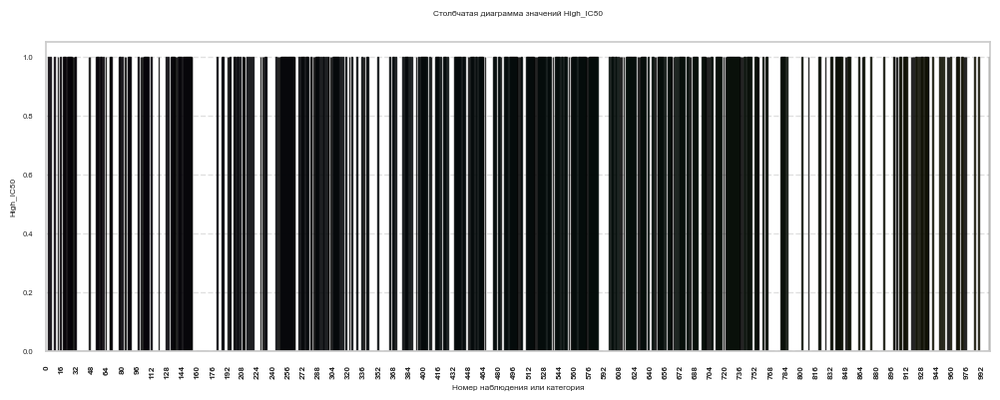

C:\Users\Eve\AppData\Roaming\Python\Python312\site-packages\seaborn\categorical.py:3399: UserWarning: 84.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


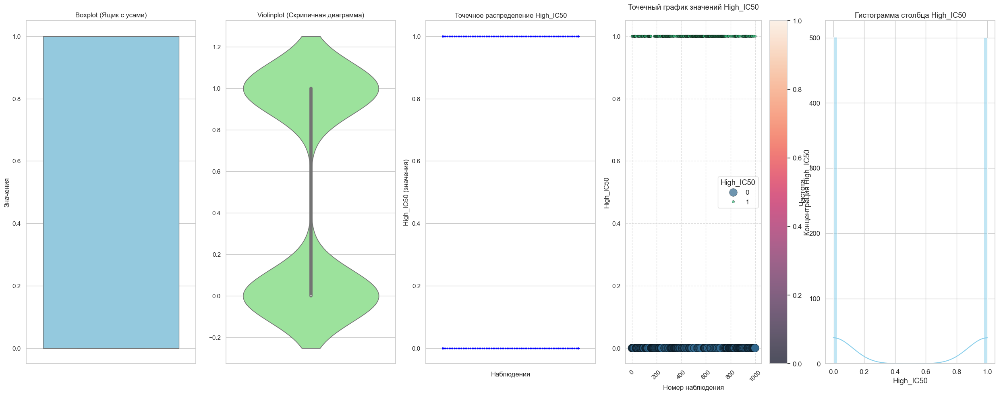

Количество выбросов по High_IC50: 0
Нижняя граница: -1.500 по графику Boxplot
Верхняя граница: 2.500 по графику Boxplot


C:\Users\Eve\AppData\Local\Temp\ipykernel_4440\4256989136.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


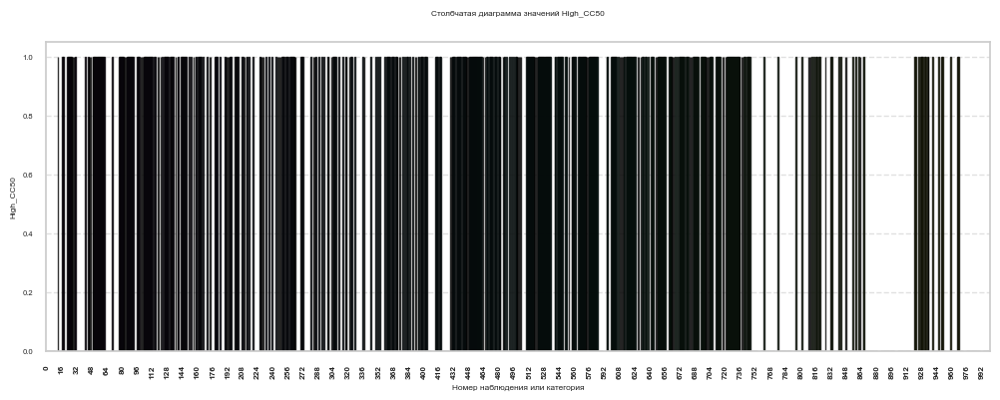

C:\Users\Eve\AppData\Roaming\Python\Python312\site-packages\seaborn\categorical.py:3399: UserWarning: 84.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


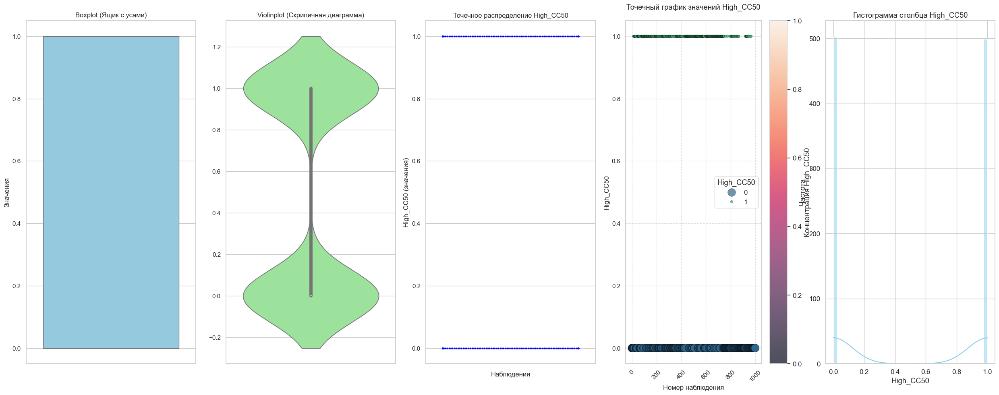

Количество выбросов по High_CC50: 0
Нижняя граница: -1.500 по графику Boxplot
Верхняя граница: 2.500 по графику Boxplot


C:\Users\Eve\AppData\Local\Temp\ipykernel_4440\4256989136.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


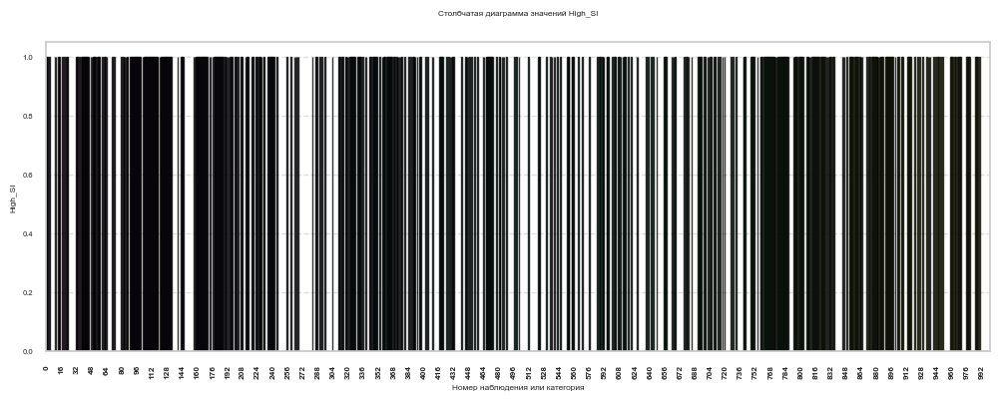

C:\Users\Eve\AppData\Roaming\Python\Python312\site-packages\seaborn\categorical.py:3399: UserWarning: 84.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


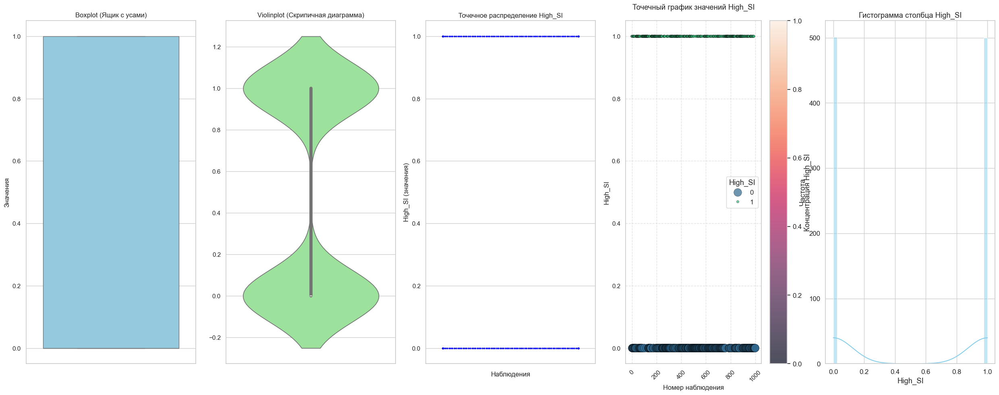

Количество выбросов по High_SI: 0
Нижняя граница: -1.500 по графику Boxplot
Верхняя граница: 2.500 по графику Boxplot


C:\Users\Eve\AppData\Local\Temp\ipykernel_4440\4256989136.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


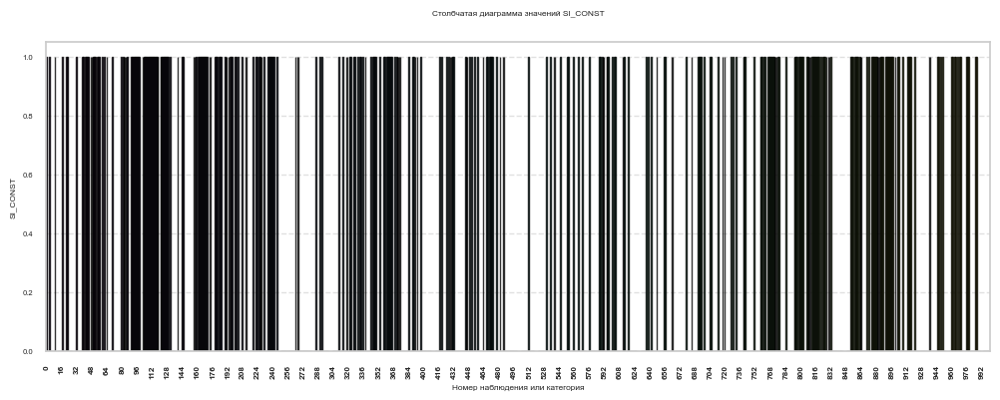

C:\Users\Eve\AppData\Roaming\Python\Python312\site-packages\seaborn\categorical.py:3399: UserWarning: 8.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Eve\AppData\Roaming\Python\Python312\site-packages\seaborn\categorical.py:3399: UserWarning: 84.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


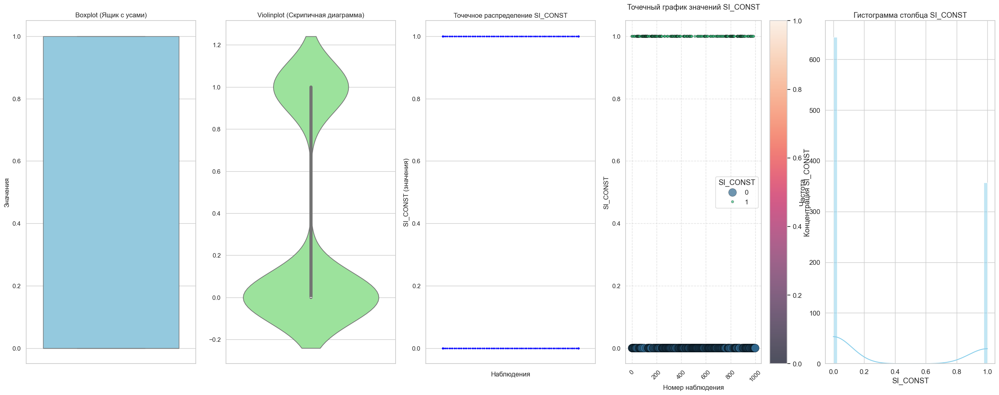

Количество выбросов по SI_CONST: 0
Нижняя граница: -1.500 по графику Boxplot
Верхняя граница: 2.500 по графику Boxplot


In [433]:
visualize_column(dataset_IC50_median, 'High_IC50')
visualize_column(dataset_CC50_median, 'High_CC50')
visualize_column(dataset_SI_median, 'High_SI')
visualize_column(dataset_SI_const, 'SI_CONST')

Поскольку целевые переменные сформирована искусственно, то исследование на наличие выбросов не требуется

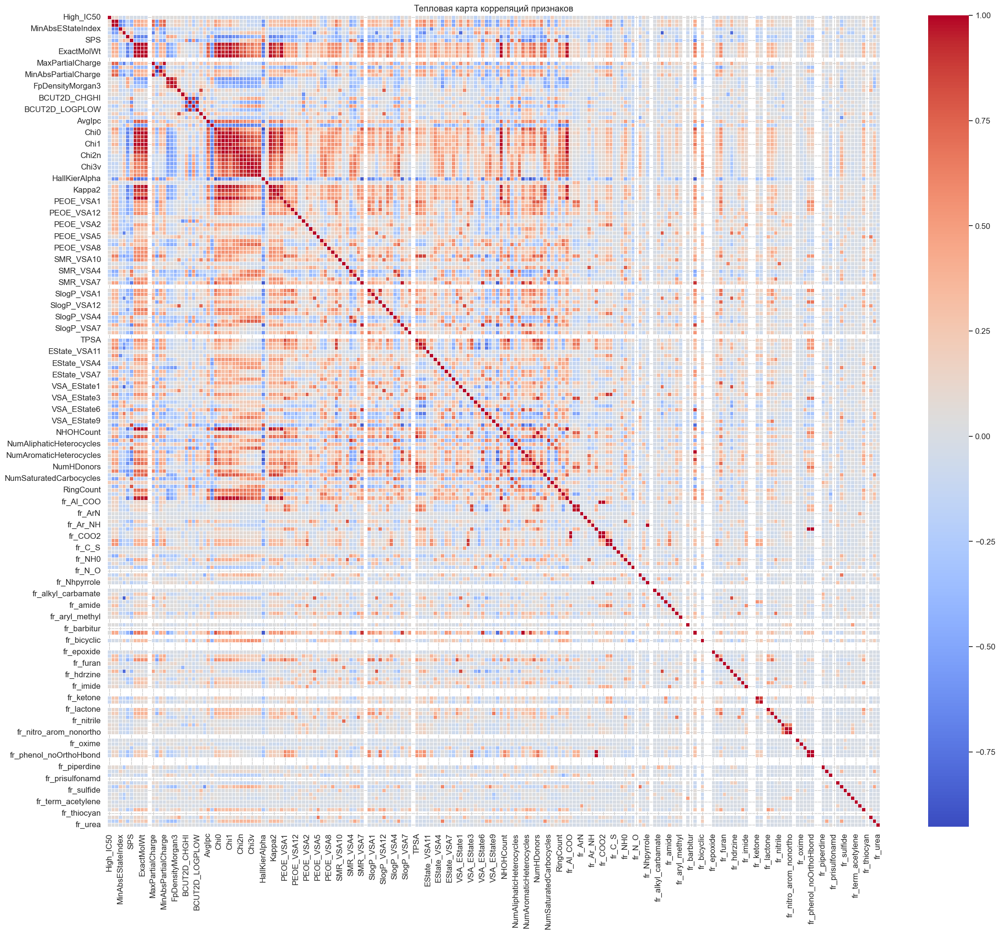

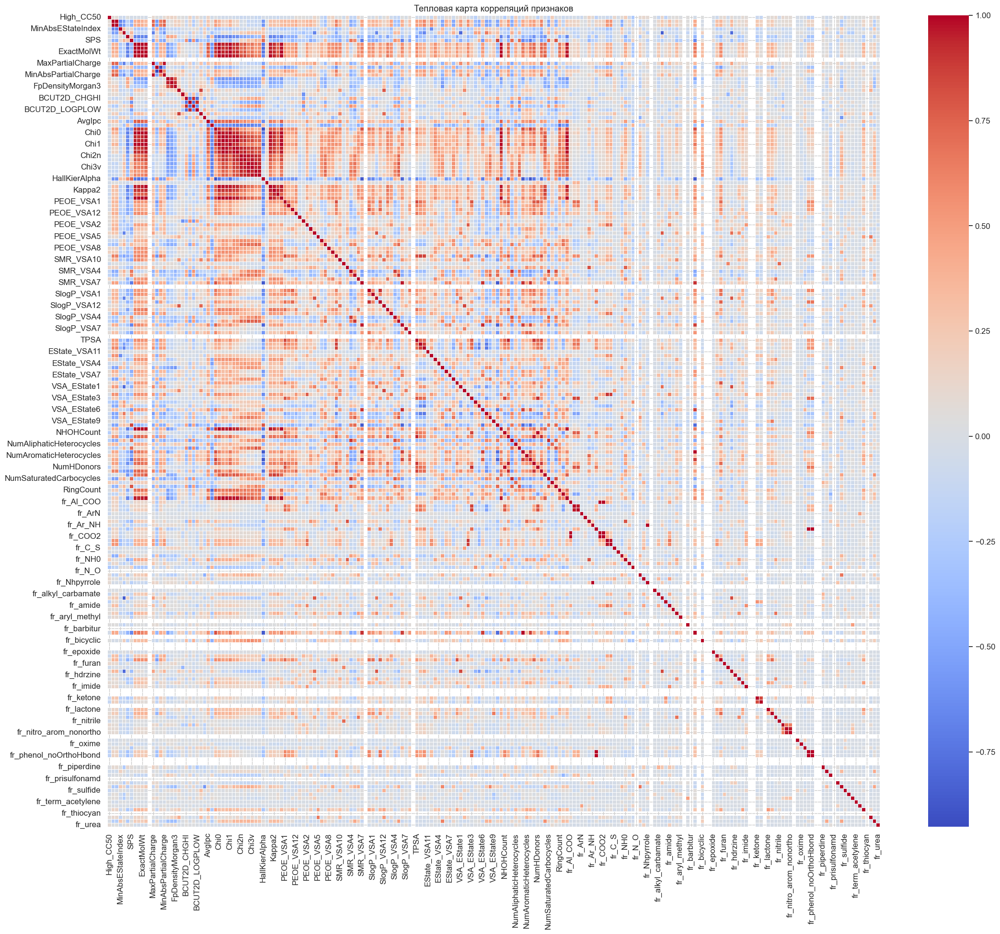

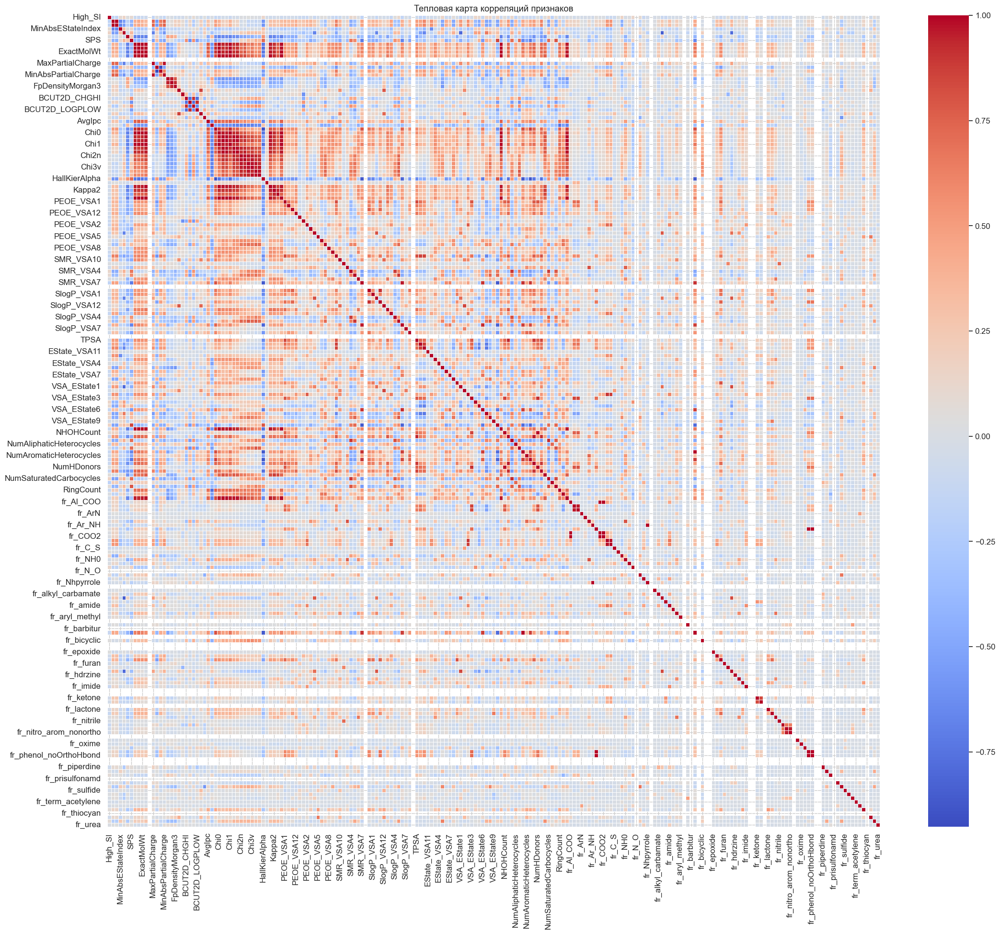

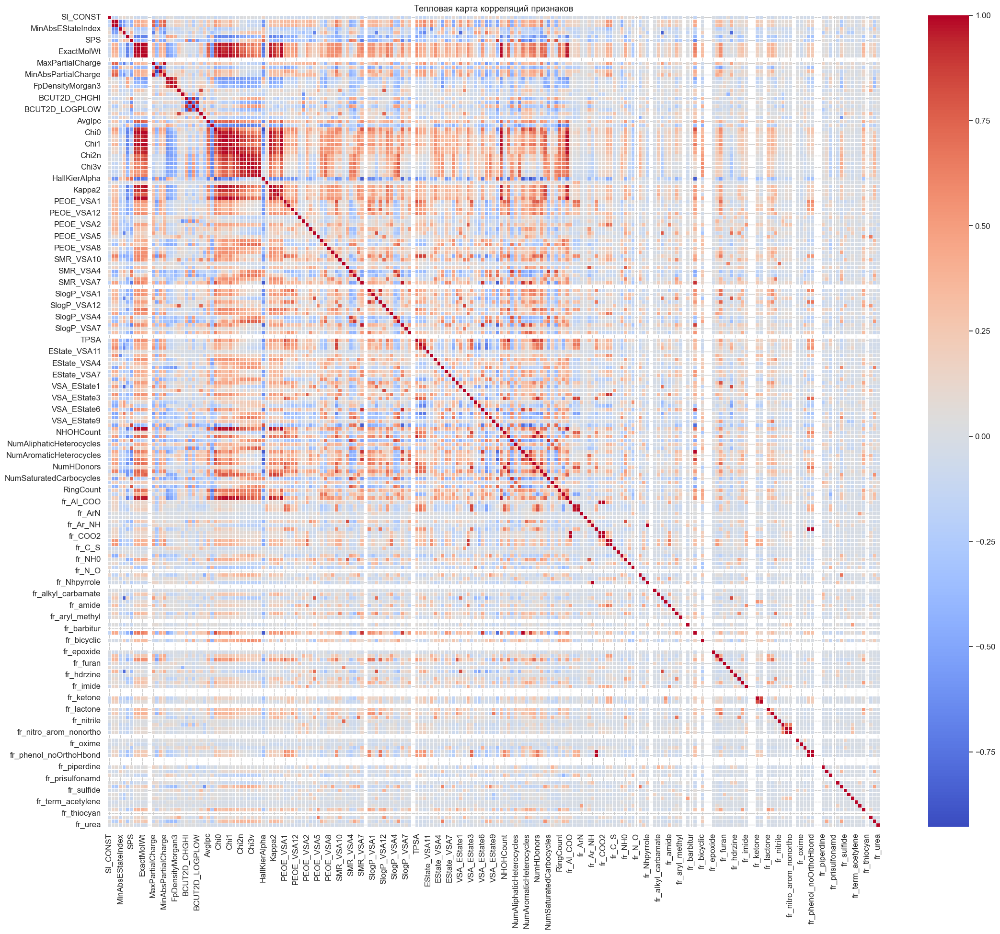

In [434]:
# Отображение тепловых карт корреляций признаков для всех датасетов с новыми переменными

# для целевой переменной High_IC50
dataset_heatmap(dataset_IC50_median)

# для целевой переменной High_СC50
dataset_heatmap(dataset_CC50_median)

# для целевой переменной High_SI
dataset_heatmap(dataset_SI_median)

# для целевой переменной SI_CONST
dataset_heatmap(dataset_SI_const)




Тепловые карты каждого датасета в отдельности свидельствуют о наличии признаков, корреляция которых с целевой переменной имеет значение Nan. Данные признаки следует удалить.

In [435]:
# Вывод признаков, коррелирующих с целевой переменной Hig
print('Удаление признаков, корреляция которых равна NaN для датасета dataset_IC5_median')
dataset_IC50_median = target_corr_clean(dataset_IC50_median, 'High_IC50')
print('---------------------------------------------------------------------------------')

print('Удаление признаков, корреляция которых равна NaN для датасета dataset_CC5_median')
dataset_CC50_median = target_corr_clean(dataset_CC50_median, 'High_CC50')
print('---------------------------------------------------------------------------------')

print('Удаление признаков, корреляция которых равна NaN для датасета dataset_SI_median')
dataset_SI_median = target_corr_clean(dataset_SI_median, 'High_SI')
print('---------------------------------------------------------------------------------')

print('Удаление признаков, корреляция которых равна NaN для датасета dataset_SI_const')
dataset_SI_const = target_corr_clean(dataset_SI_const, 'SI_CONST')
print('---------------------------------------------------------------------------------')


Удаление признаков, корреляция которых равна NaN для датасета dataset_IC5_median
Удалены столбцы с NaN корреляцией с 'High_IC50': ['NumRadicalElectrons', 'SMR_VSA8', 'SlogP_VSA9', 'fr_N_O', 'fr_SH', 'fr_azide', 'fr_barbitur', 'fr_benzodiazepine', 'fr_diazo', 'fr_dihydropyridine', 'fr_isocyan', 'fr_isothiocyan', 'fr_lactam', 'fr_nitroso', 'fr_phos_acid', 'fr_phos_ester', 'fr_prisulfonamd', 'fr_thiocyan']
Корреляция признаков с целевым столбцом 'High_IC50':
NumSaturatedHeterocycles    0.231725
SlogP_VSA5                 -0.202180
NumAliphaticHeterocycles    0.192135
VSA_EState8                -0.189516
NumAliphaticCarbocycles    -0.179115
                              ...   
VSA_EState5                -0.001573
BCUT2D_MRHI                -0.001020
TPSA                       -0.000956
fr_thiazole                 0.000234
fr_oxazole                  0.000063
Name: High_IC50, Length: 192, dtype: float64
---------------------------------------------------------------------------------
Удален

Удалены признаки с высокой взаимной корреляцией (>0.7): ['Kappa2', 'NumSaturatedRings', 'RingCount', 'fr_C_O_noCOO', 'VSA_EState6', 'MaxAbsEStateIndex', 'NumSaturatedCarbocycles', 'fr_ether', 'BalabanJ', 'Chi0v', 'SlogP_VSA11', 'TPSA', 'FpDensityMorgan2', 'fr_COO2', 'fr_phenol', 'Kappa3', 'SPS', 'SMR_VSA3', 'HeavyAtomMolWt', 'fr_phenol_noOrthoHbond', 'Chi1n', 'SlogP_VSA4', 'MolMR', 'SMR_VSA4', 'Chi1', 'PEOE_VSA1', 'Chi3v', 'MinAbsPartialCharge', 'NOCount', 'FpDensityMorgan1', 'AvgIpc', 'SlogP_VSA12', 'BCUT2D_MRHI', 'Chi0', 'fr_benzene', 'fr_Al_OH', 'Chi4v', 'VSA_EState2', 'NumAromaticCarbocycles', 'PEOE_VSA2', 'EState_VSA9', 'BCUT2D_CHGLO', 'fr_COO', 'Chi0n', 'EState_VSA10', 'Chi4n', 'Chi3n', 'MaxAbsPartialCharge', 'BertzCT', 'SlogP_VSA2', 'NumAliphaticRings', 'SMR_VSA2', 'NumValenceElectrons', 'NumAliphaticHeterocycles', 'fr_Al_OH_noTert', 'PEOE_VSA11', 'MinEStateIndex', 'SMR_VSA7', 'fr_Ar_NH', 'PEOE_VSA7', 'fr_alkyl_halide', 'HeavyAtomCount', 'Chi2v', 'Chi1v', 'SlogP_VSA10', 'fr_Ar_N

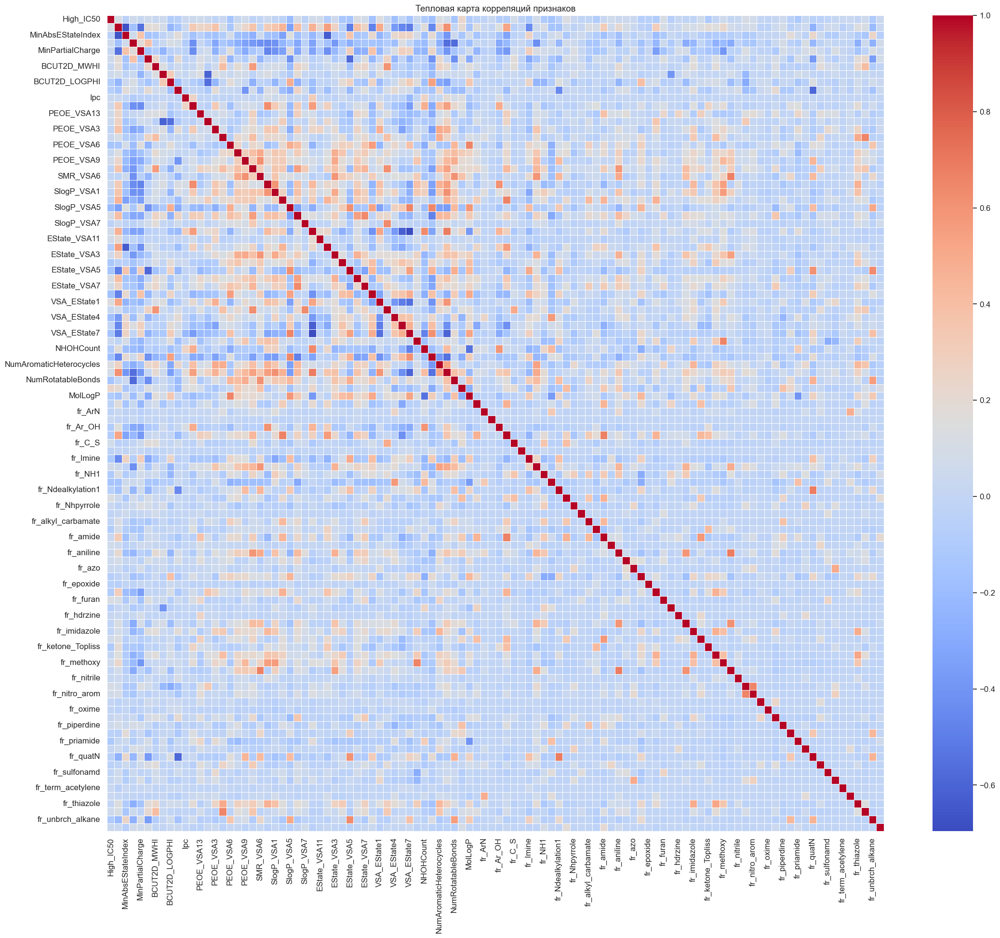

Удалены признаки с высокой взаимной корреляцией (>0.7): ['Kappa2', 'NumSaturatedRings', 'RingCount', 'fr_C_O_noCOO', 'VSA_EState6', 'MaxAbsEStateIndex', 'NumSaturatedCarbocycles', 'fr_ether', 'FpDensityMorgan3', 'Chi0v', 'TPSA', 'SlogP_VSA11', 'fr_COO2', 'fr_phenol', 'SPS', 'SlogP_VSA6', 'SMR_VSA3', 'HeavyAtomMolWt', 'NumRotatableBonds', 'fr_phenol_noOrthoHbond', 'Chi1n', 'SlogP_VSA4', 'MolMR', 'EState_VSA1', 'SMR_VSA4', 'Chi1', 'PEOE_VSA1', 'Chi3v', 'MinAbsPartialCharge', 'NOCount', 'FpDensityMorgan1', 'SlogP_VSA12', 'BCUT2D_MRHI', 'Chi0', 'fr_benzene', 'fr_Al_OH', 'Chi4v', 'VSA_EState2', 'NumAromaticCarbocycles', 'BCUT2D_LOGPHI', 'VSA_EState1', 'PEOE_VSA2', 'fr_COO', 'Chi0n', 'EState_VSA10', 'Chi4n', 'Chi3n', 'MaxAbsPartialCharge', 'BertzCT', 'NumAliphaticRings', 'NumValenceElectrons', 'NumAliphaticHeterocycles', 'fr_Al_OH_noTert', 'PEOE_VSA11', 'MinEStateIndex', 'SMR_VSA7', 'fr_Ar_NH', 'fr_alkyl_halide', 'HeavyAtomCount', 'Chi2v', 'Chi1v', 'SlogP_VSA10', 'SlogP_VSA5', 'fr_Ar_N', 'Nu

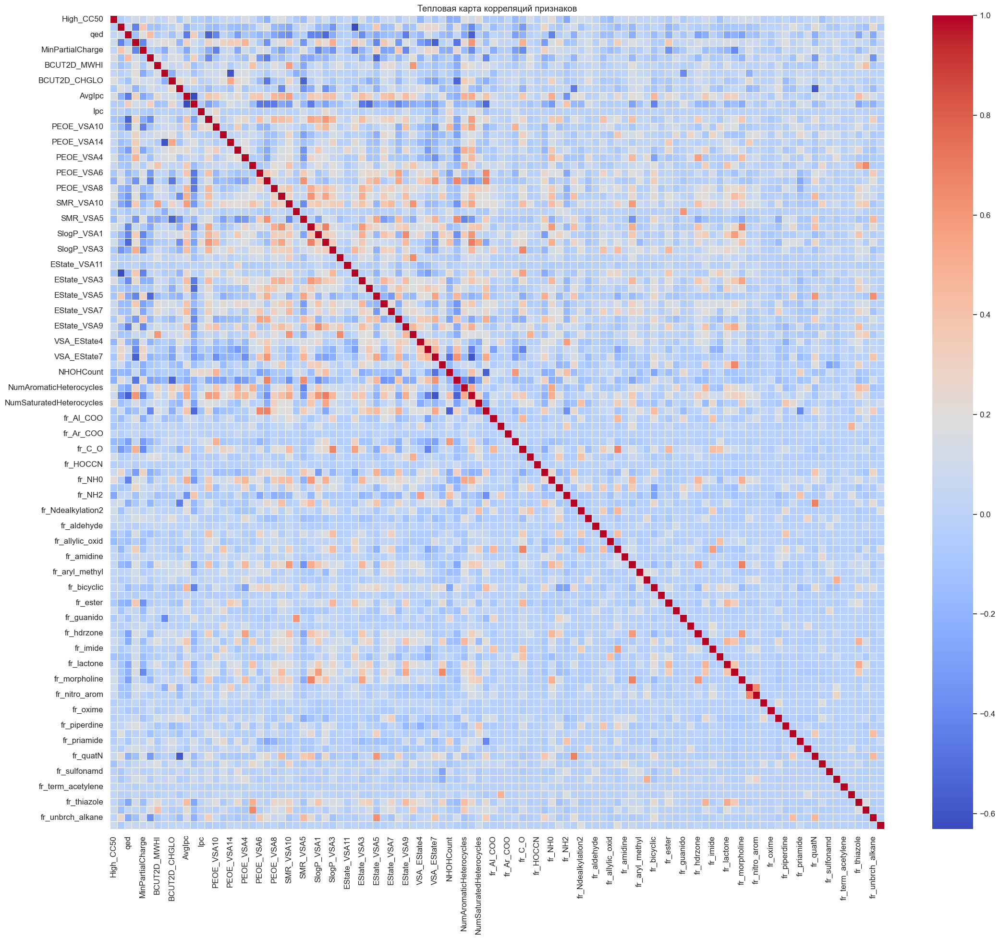

Удалены признаки с высокой взаимной корреляцией (>0.7): ['Kappa2', 'NumSaturatedRings', 'RingCount', 'fr_NH0', 'fr_C_O_noCOO', 'VSA_EState6', 'MaxAbsEStateIndex', 'NumSaturatedCarbocycles', 'fr_ether', 'BalabanJ', 'Chi0v', 'SlogP_VSA11', 'TPSA', 'FpDensityMorgan2', 'BCUT2D_MWHI', 'fr_COO2', 'fr_phenol', 'Kappa3', 'SPS', 'SlogP_VSA6', 'fr_phenol_noOrthoHbond', 'HeavyAtomMolWt', 'NumRotatableBonds', 'Chi1n', 'SlogP_VSA4', 'MolMR', 'EState_VSA1', 'fr_C_O', 'SMR_VSA4', 'Chi1', 'PEOE_VSA1', 'Chi3v', 'NumAromaticHeterocycles', 'MinAbsPartialCharge', 'NOCount', 'FpDensityMorgan1', 'AvgIpc', 'SlogP_VSA12', 'Chi0', 'fr_benzene', 'fr_Al_OH', 'Chi4v', 'VSA_EState2', 'NumAromaticCarbocycles', 'EState_VSA9', 'BCUT2D_CHGLO', 'fr_COO', 'Chi0n', 'Chi4n', 'NHOHCount', 'Chi3n', 'BertzCT', 'SlogP_VSA2', 'NumAliphaticRings', 'SMR_VSA2', 'NumValenceElectrons', 'NumAliphaticHeterocycles', 'fr_Al_OH_noTert', 'NumAliphaticCarbocycles', 'MinEStateIndex', 'SMR_VSA7', 'fr_Ar_NH', 'PEOE_VSA7', 'fr_alkyl_halide', 

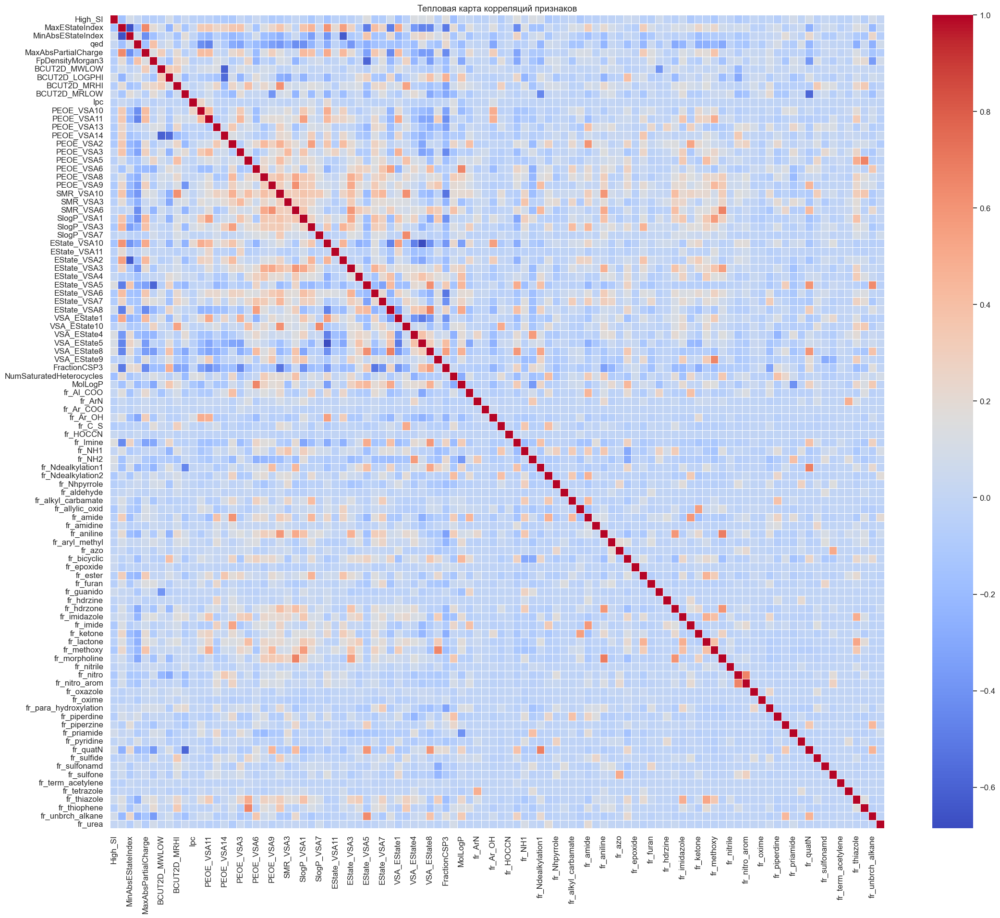

Удалены признаки с высокой взаимной корреляцией (>0.7): ['Kappa2', 'NumSaturatedRings', 'VSA_EState6', 'MaxAbsEStateIndex', 'NumSaturatedCarbocycles', 'fr_Ar_OH', 'fr_ether', 'NumSaturatedHeterocycles', 'BalabanJ', 'FpDensityMorgan3', 'Chi0v', 'VSA_EState10', 'SlogP_VSA11', 'TPSA', 'FpDensityMorgan2', 'BCUT2D_MWHI', 'fr_COO2', 'fr_phenol', 'Kappa3', 'SPS', 'SlogP_VSA6', 'SMR_VSA3', 'HeavyAtomMolWt', 'fr_phenol_noOrthoHbond', 'Chi1n', 'SlogP_VSA4', 'MolMR', 'EState_VSA1', 'fr_C_O', 'SMR_VSA4', 'Chi1', 'PEOE_VSA1', 'Chi3v', 'NumAromaticHeterocycles', 'MinAbsPartialCharge', 'NOCount', 'AvgIpc', 'SlogP_VSA12', 'Chi0', 'fr_benzene', 'fr_Al_OH', 'Chi4v', 'VSA_EState2', 'NumAromaticCarbocycles', 'PEOE_VSA2', 'EState_VSA9', 'BCUT2D_CHGLO', 'fr_COO', 'Chi0n', 'Chi4n', 'NHOHCount', 'Chi3n', 'BertzCT', 'SlogP_VSA2', 'NumAliphaticRings', 'NumValenceElectrons', 'fr_Al_OH_noTert', 'PEOE_VSA11', 'NumAliphaticCarbocycles', 'MinEStateIndex', 'SMR_VSA7', 'fr_Ar_NH', 'PEOE_VSA7', 'fr_alkyl_halide', 'MinP

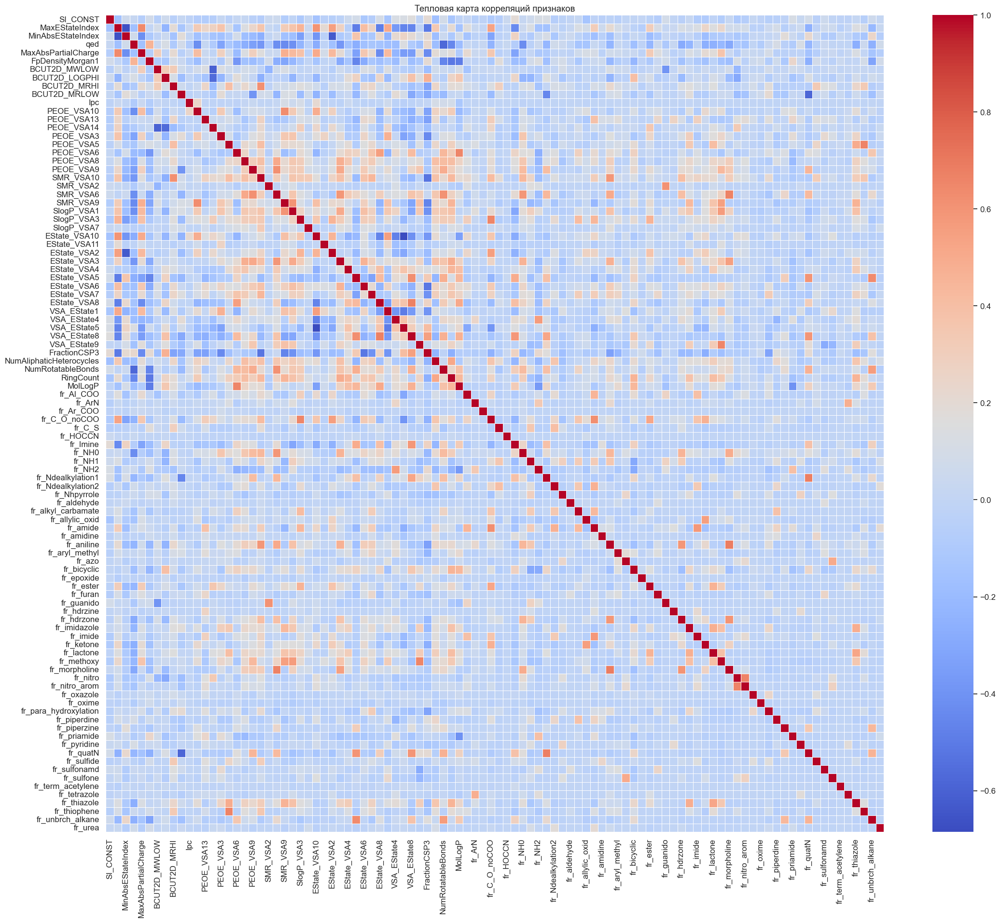

In [436]:
# С помощью функции remove_highly_correlated_features находим и удаляем признаки, степень корреляиции которых между собой 
#  более (|corr| > 0.7) для всех датасектов

dataset_IC50_median, dropped = remove_highly_correlated_features(dataset_IC50_median, 'High_IC50')
dataset_heatmap(dataset_IC50_median)

dataset_CC50_median, dropped = remove_highly_correlated_features(dataset_CC50_median, 'High_CC50')
dataset_heatmap(dataset_CC50_median)

dataset_SI_median, dropped = remove_highly_correlated_features(dataset_SI_median, 'High_SI')
dataset_heatmap(dataset_SI_median)

dataset_SI_const, dropped = remove_highly_correlated_features(dataset_SI_const, 'SI_CONST')
dataset_heatmap(dataset_SI_const)


Из приведенных тепловых карт следует, что после применения функции remove_highly_correlated_features удалены признаки с высокой взаимной корреляцией.

In [437]:
# Нормализация признаков в датасетах при сохранении значений целевых переменных.
dataset_IC50_median = normalize_features(dataset_IC50_median,'High_IC50')
dataset_CC50_median = normalize_features(dataset_CC50_median,'High_CC50')
dataset_SI_median = normalize_features(dataset_SI_median,'High_SI')
dataset_SI_const = normalize_features(dataset_SI_const,'SI_CONST')


Вывод итоговых датасетов

In [438]:
dataset_IC50_median.head()


,High_IC50,MaxEStateIndex,MinAbsEStateIndex,qed,MinPartialCharge,FpDensityMorgan3,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_LOGPHI,BCUT2D_MRLOW,...,fr_quatN,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiophene,fr_unbrch_alkane,fr_urea
0,0,-1.735571,1.224868,-0.768654,1.426002,-2.770338,-0.570571,-0.088877,0.864587,1.054704,...,-0.181261,-0.208381,-0.110152,-0.09525,-0.031623,-0.031623,-0.234082,-0.274204,2.301113,-0.083918
1,0,-2.078199,2.094509,-0.555991,1.174415,-2.860505,-0.560071,-0.104802,0.930493,0.761047,...,-0.181261,-0.208381,-0.110152,-0.09525,-0.031623,-0.031623,-0.234082,-0.274204,2.301113,-0.083918
2,1,-2.481816,2.150030,-1.506141,1.020462,-3.187359,-0.534044,-0.116039,1.030345,-3.426433,...,6.416628,-0.208381,-0.110152,-0.09525,-0.031623,-0.031623,-0.234082,-0.274204,2.301113,-0.083918
3,0,-1.734583,1.244900,-0.954942,1.426002,-2.798321,-0.570644,-0.088838,0.864640,1.054822,...,-0.181261,-0.208381,-0.110152,-0.09525,-0.031623,-0.031623,-0.234082,-0.274204,3.124349,-0.083918
4,1,-1.718506,0.532513,-0.713608,1.885175,-2.932638,-0.569964,-0.088996,0.882823,1.055530,...,-0.181261,-0.208381,-0.110152,-0.09525,-0.031623,-0.031623,-0.234082,-0.274204,-0.168595,-0.083918


In [439]:
dataset_CC50_median.head()


,High_CC50,MinAbsEStateIndex,qed,MaxPartialCharge,MinPartialCharge,FpDensityMorgan2,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGLO,BCUT2D_MRLOW,...,fr_quatN,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiophene,fr_unbrch_alkane,fr_urea
0,0,1.224868,-0.768654,-1.511418,1.426002,-2.461836,-0.570571,-0.088877,-0.014410,1.054704,...,-0.181261,-0.208381,-0.110152,-0.09525,-0.031623,-0.031623,-0.234082,-0.274204,2.301113,-0.083918
1,0,2.094509,-0.555991,-1.711378,1.174415,-2.573286,-0.560071,-0.104802,-0.258058,0.761047,...,-0.181261,-0.208381,-0.110152,-0.09525,-0.031623,-0.031623,-0.234082,-0.274204,2.301113,-0.083918
2,0,2.150030,-1.506141,-1.080347,1.020462,-2.865841,-0.534044,-0.116039,-0.647615,-3.426433,...,6.416628,-0.208381,-0.110152,-0.09525,-0.031623,-0.031623,-0.234082,-0.274204,2.301113,-0.083918
3,0,1.244900,-0.954942,-1.511418,1.426002,-2.573286,-0.570644,-0.088838,-0.013478,1.054822,...,-0.181261,-0.208381,-0.110152,-0.09525,-0.031623,-0.031623,-0.234082,-0.274204,3.124349,-0.083918
4,0,0.532513,-0.713608,-1.326120,1.885175,-2.662446,-0.569964,-0.088996,-0.009344,1.055530,...,-0.181261,-0.208381,-0.110152,-0.09525,-0.031623,-0.031623,-0.234082,-0.274204,-0.168595,-0.083918


In [440]:
dataset_SI_median.head()


,High_SI,MaxEStateIndex,MinAbsEStateIndex,qed,MaxAbsPartialCharge,FpDensityMorgan3,BCUT2D_MWLOW,BCUT2D_LOGPHI,BCUT2D_MRHI,BCUT2D_MRLOW,...,fr_quatN,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiophene,fr_unbrch_alkane,fr_urea
0,1,-1.735571,1.224868,-0.768654,-1.606137,-2.770338,-0.088877,0.864587,-0.290745,1.054704,...,-0.181261,-0.208381,-0.110152,-0.09525,-0.031623,-0.031623,-0.234082,-0.274204,2.301113,-0.083918
1,1,-2.078199,2.094509,-0.555991,-1.342164,-2.860505,-0.104802,0.930493,-1.000085,0.761047,...,-0.181261,-0.208381,-0.110152,-0.09525,-0.031623,-0.031623,-0.234082,-0.274204,2.301113,-0.083918
2,0,-2.481816,2.150030,-1.506141,-1.180632,-3.187359,-0.116039,1.030345,-1.015270,-3.426433,...,6.416628,-0.208381,-0.110152,-0.09525,-0.031623,-0.031623,-0.234082,-0.274204,2.301113,-0.083918
3,1,-1.734583,1.244900,-0.954942,-1.606137,-2.798321,-0.088838,0.864640,-0.290760,1.054822,...,-0.181261,-0.208381,-0.110152,-0.09525,-0.031623,-0.031623,-0.234082,-0.274204,3.124349,-0.083918
4,0,-1.718506,0.532513,-0.713608,-2.087917,-2.932638,-0.088996,0.882823,-0.274168,1.055530,...,-0.181261,-0.208381,-0.110152,-0.09525,-0.031623,-0.031623,-0.234082,-0.274204,-0.168595,-0.083918


In [441]:
dataset_SI_const.head()

,SI_CONST,MaxEStateIndex,MinAbsEStateIndex,qed,MaxAbsPartialCharge,FpDensityMorgan1,BCUT2D_MWLOW,BCUT2D_LOGPHI,BCUT2D_MRHI,BCUT2D_MRLOW,...,fr_quatN,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiophene,fr_unbrch_alkane,fr_urea
0,1,-1.735571,1.224868,-0.768654,-1.606137,-2.076304,-0.088877,0.864587,-0.290745,1.054704,...,-0.181261,-0.208381,-0.110152,-0.09525,-0.031623,-0.031623,-0.234082,-0.274204,2.301113,-0.083918
1,0,-2.078199,2.094509,-0.555991,-1.342164,-2.224521,-0.104802,0.930493,-1.000085,0.761047,...,-0.181261,-0.208381,-0.110152,-0.09525,-0.031623,-0.031623,-0.234082,-0.274204,2.301113,-0.083918
2,0,-2.481816,2.150030,-1.506141,-1.180632,-2.409791,-0.116039,1.030345,-1.015270,-3.426433,...,6.416628,-0.208381,-0.110152,-0.09525,-0.031623,-0.031623,-0.234082,-0.274204,2.301113,-0.083918
3,1,-1.734583,1.244900,-0.954942,-1.606137,-2.168300,-0.088838,0.864640,-0.290760,1.054822,...,-0.181261,-0.208381,-0.110152,-0.09525,-0.031623,-0.031623,-0.234082,-0.274204,3.124349,-0.083918
4,0,-1.718506,0.532513,-0.713608,-2.087917,-2.254164,-0.088996,0.882823,-0.274168,1.055530,...,-0.181261,-0.208381,-0.110152,-0.09525,-0.031623,-0.031623,-0.234082,-0.274204,-0.168595,-0.083918


In [ ]:
# Сохранение всех датасетов в формате CSV
dataset_for_CC50_950.to_csv('F:\\MIFI-github\\Course work Classic ML\\Data\\dataset_for_CC50_950.csv', index=False, encoding='utf-8')

dataset_for_IC50_567.to_csv('F:\\MIFI-github\\Course work Classic ML\\Data\\dataset_for_IC50_567.csv', index=False, encoding='utf-8')
dataset_for_IC50_854.to_csv('F:\\MIFI-github\\Course work Classic ML\\Data\\dataset_for_IC50_854.csv', index=False, encoding='utf-8')

dataset_for_SI_876.to_csv('F:\\MIFI-github\\Course work Classic ML\\Data\\dataset_for_SI_876.csv', index=False, encoding='utf-8')
dataset_for_SI_588.to_csv('F:\\MIFI-github\\Course work Classic ML\\Data\\dataset_for_SI_588.csv', index=False, encoding='utf-8')

dataset_IC50_median.to_csv('F:\\MIFI-github\\Course work Classic ML\\Data\\dataset_IC50_median.csv', index=False, encoding='utf-8')
dataset_CC50_median.to_csv('F:\\MIFI-github\\Course work Classic ML\\Data\\dataset_CC50_median.csv', index=False, encoding='utf-8')
dataset_SI_median.to_csv('F:\\MIFI-github\\Course work Classic ML\\Data\\dataset_SI_median.csv', index=False, encoding='utf-8')

dataset_SI_const.to_csv('F:\\MIFI-github\\Course work Classic ML\\Data\\dataset_SI_const.csv', index=False, encoding='utf-8')





